In [2]:
import pandas as pd
import numpy as np
import pathlib
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [3]:

data_csv =  sorted(str(p) for p in pathlib.Path("C:\\Users\\USER\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw").glob("*.csv"))
print(len(data_csv))
data_csv

17


['C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw\\AB.csv',
 'C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw\\ABB.csv',
 'C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw\\AG.csv',
 'C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw\\AMP.csv',
 'C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw\\AT.csv',
 'C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw\\CB.csv',
 'C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw\\CP.csv',
 'C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw\\CT.csv',
 'C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw\\DG.csv',
 'C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\0_data_raw\\EV.csv',
 'C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_

In [30]:
# data_csv = sorted(data_csv , key=lambda x: int(x.split('_')[-1].split('.')[0]))
# data_csv

In [31]:
# delim = detect_delimiter(data_csv[13])
# delim 

In [33]:
# # data_l = []
# def data_list (data_csv):
#     data_l = []
#     for elem in data_csv:
#         data = pd.read_csv(elem, header=0, sep=';')
#         df_new = data.drop(columns=['dot_mvt_start_time','ast_dot_time','button_pressed_time','end_time','start_exp_time','time_from_start [ces]'])
#         df_new['prop_left'] = df_new['response'].apply(lambda x: 0 if x == 1 else 1)
#         df_new['acc'] = df_new[['slope','response']].apply(lambda x: 1 if np.sign(x['prop_left'])= np.sign(x['slop']) else 0 )
#         for i in  
#         data_l.append(data)
#     return data_l

In [4]:
import csv

def detect_delimiter(csv_file):
    with open(csv_file, 'r') as file:
        dialect = csv.Sniffer().sniff(file.readline())
    return dialect.delimiter

def data_list(data_csv):
    data_l = []
    for elem in data_csv:
        delimiter = detect_delimiter(elem)
        data = pd.read_csv(elem, header=0, sep=delimiter)
        df_new = data.drop(columns=['dot_mvt_start_time', 'last_dot_time','fix_start_time', 'button_pressed_time', 'end_time', 'start_exp_time', 'time_from_start [ces]'])
        df_new['prop_left'] = df_new['response'].apply(lambda x: 0 if x == 1 else 1)
        df_new['acc'] = df_new.apply(lambda row: 1 if np.sign(row['response']) == np.sign(row['slope']) else 0, axis=1)
        df_new['RT'] = df_new['RT'].apply(lambda x :x/1000)
        data_l.append(df_new)
    return data_l

In [5]:
data_l=  data_list(data_csv)

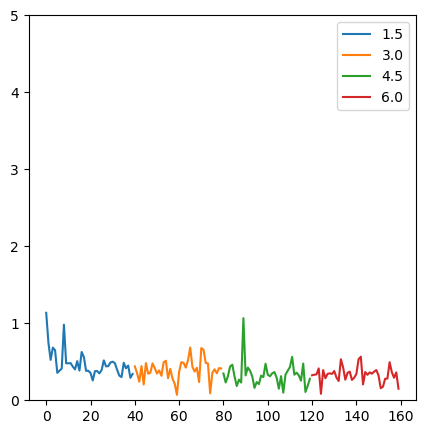

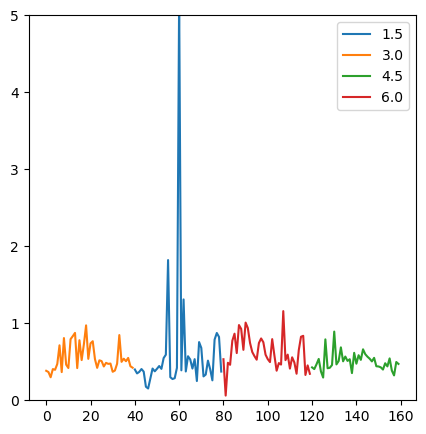

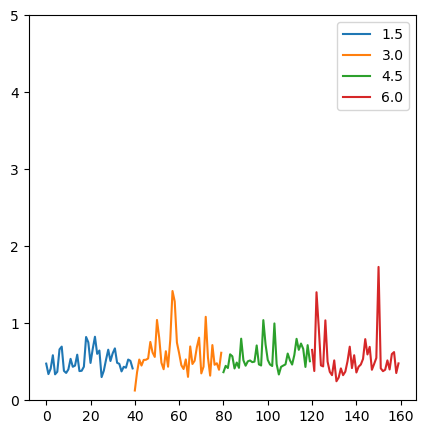

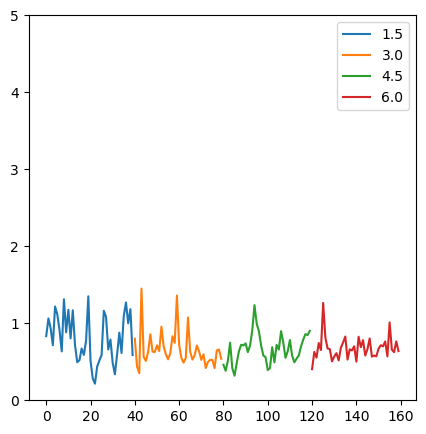

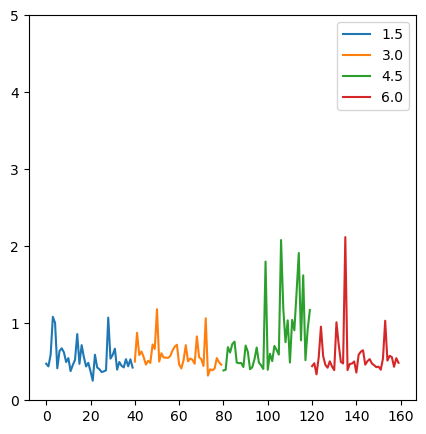

...

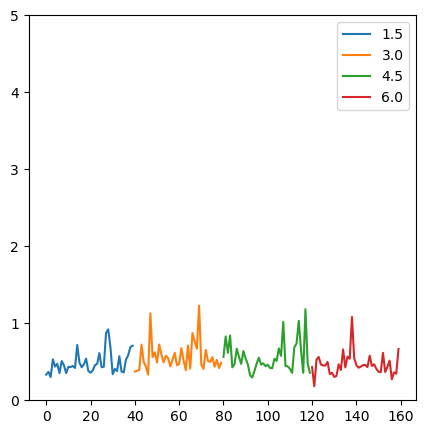

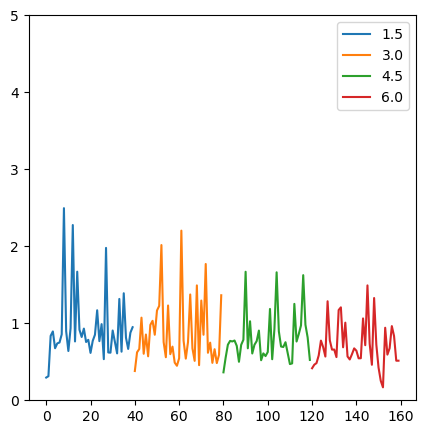

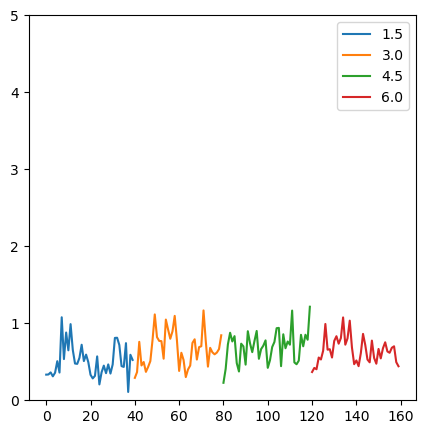

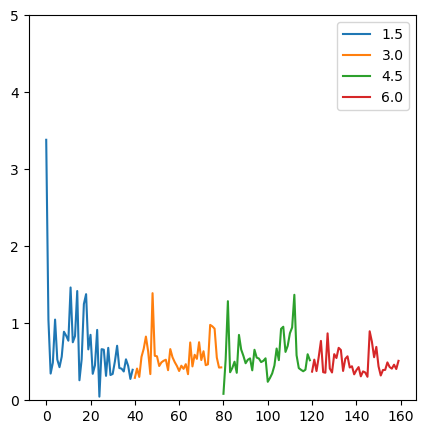

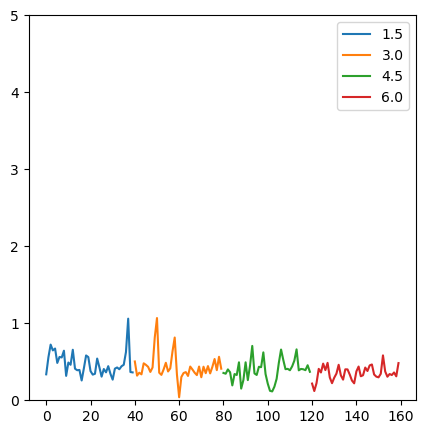

In [5]:
# Traitement des anomalies
for elem in data_l:
    fig =plt.figure(figsize=(5, 5))
    grouped = elem.groupby('noise_lvl')['RT'].plot(legend = True)
    plt.ylim(0,5)

In [37]:
for elem in data_l:
    print(elem['RT'].min(), elem['RT'].max())

0.071 1.136
0.061 5.223
0.127 1.732
0.215 1.45
0.254 2.119
0.023 1.803
0.038 2.313
0.163 2.226
0.039 1.068
0.245 2.584
0.205 3.294
0.355 2.561
0.182 1.228
0.168 2.495
0.108 1.215
0.047 3.383
0.039 1.068


In [38]:
# for elem in data_l:
#     fig =plt.figure(figsize=(5, 5))
#     elem.groupby('noise_lvl',)['RT'].plot.hist(legend = True)
#     plt.xlim(0,2)

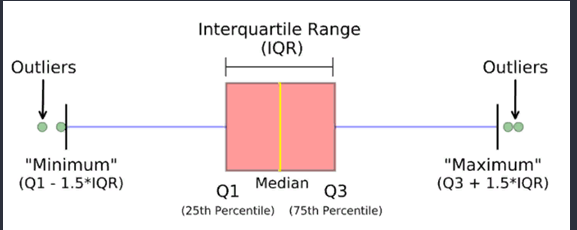

In [6]:
def remove_anomaly_IQR(data_list):
    data_clean_list = []
    for elem in data_list:
        df = elem
#         up_0 = df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[0] +1.5*(df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[0]-df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[0])
        up_15 = df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[0] +1.5*(df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[0]-df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[0])
        up_3 = df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[1] +1.5*(df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[1]-df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[1])
        up_45 = df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[2] +1.5*(df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[2]-df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[2])
        up_6 = df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[3] +1.5*(df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[3]-df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[3])
        
#         low_0 = df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[0] -1.5*(df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[0]-df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[0])
        low_15 = df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[0] -1.5*(df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[0]-df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[0])
        low_3 = df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[1] -1.5*(df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[1]-df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[1])
        low_45 = df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[2] -1.5*(df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[2]-df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[2])
        low_6 = df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[3] -1.5*(df.groupby("noise_lvl")['RT'].quantile(0.75).iloc[3]-df.groupby("noise_lvl")['RT'].quantile(0.25).iloc[3])
        
#         df.loc[(df['noise_lvl'] == 0) & (df['RT'] > up_0), 'RT'] = df.groupby("noise_lvl")['RT'].median().iloc[0]
        df.loc[(df['noise_lvl'] == 1.5) & (df['RT'] > up_15), 'RT'] = df.groupby("noise_lvl")['RT'].median().iloc[0]
        df.loc[(df['noise_lvl'] == 3.0) & (df['RT'] > up_3), 'RT'] = df.groupby("noise_lvl")['RT'].median().iloc[1]
        df.loc[(df['noise_lvl'] == 4.5) & (df['RT'] > up_45), 'RT'] = df.groupby("noise_lvl")['RT'].median().iloc[2]
        df.loc[(df['noise_lvl'] == 6.0) & (df['RT'] > up_6), 'RT'] = df.groupby("noise_lvl")['RT'].median().iloc[3]
        
#         df.loc[(df['noise_lvl'] == 0) & (df['RT'] < low_0), 'RT'] = df.groupby("noise_lvl")['RT'].median().iloc[0]
        df.loc[(df['noise_lvl'] == 1.5) & (df['RT'] < low_15), 'RT'] = df.groupby("noise_lvl")['RT'].median().iloc[0]
        df.loc[(df['noise_lvl'] == 3.0) & (df['RT'] < low_3), 'RT'] = df.groupby("noise_lvl")['RT'].median().iloc[1]
        df.loc[(df['noise_lvl'] == 4.5) & (df['RT'] < low_45), 'RT'] = df.groupby("noise_lvl")['RT'].median().iloc[2]
        df.loc[(df['noise_lvl'] == 6.0) & (df['RT'] < low_6), 'RT'] = df.groupby("noise_lvl")['RT'].median().iloc[3]
        
        
        
        data_clean_list.append(df)
    return data_clean_list  

In [7]:
data_l_clean = remove_anomaly_IQR(data_l)

In [8]:
data_l_clean[-1]

,num_trial,path_seed,noise_lvl,slope,sd,mean,min,max,response,RT,prop_left,acc
0,0,380127118,1.5,6.0,1.49,5.98,2.81,9.17,1,0.337,0,1
1,1,380127118,1.5,4.0,1.49,3.98,0.81,7.17,1,0.559,0,1
2,2,438462352,1.5,2.0,1.49,2.00,-0.59,5.52,-1,0.723,1,0
3,3,438462352,1.5,2.5,1.49,2.50,-0.09,6.02,-1,0.648,1,0
4,4,570875540,1.5,3.0,1.50,3.02,-0.87,6.94,1,0.672,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
155,35,638354634,6.0,2.0,5.96,2.05,-12.49,18.73,1,0.341,0,1
156,36,956002509,6.0,1.5,5.96,1.48,-12.32,13.57,1,0.328,0,1
157,37,956002509,6.0,1.5,5.96,1.48,-12.32,13.57,1,0.361,0,1
158,38,728976698,6.0,1.0,6.02,1.11,-13.74,13.79,1,0.311,0,1


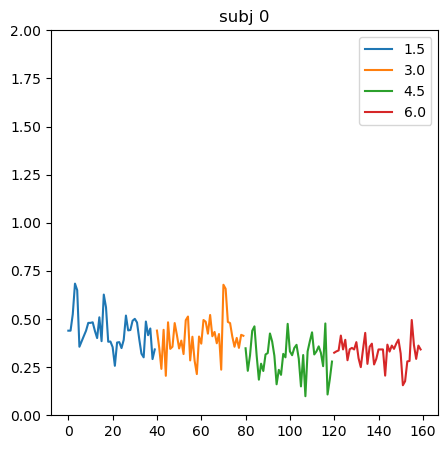

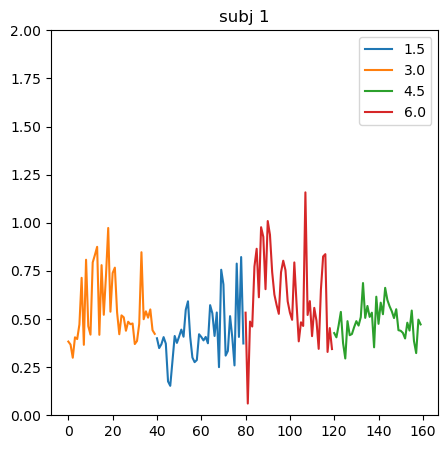

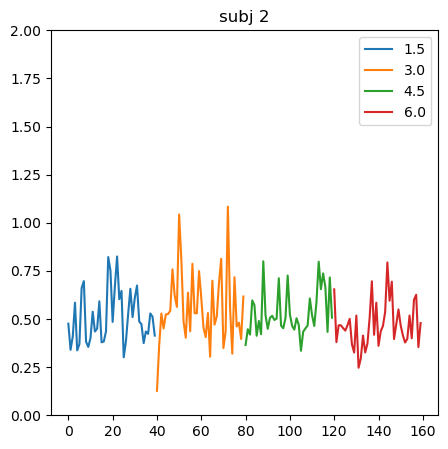

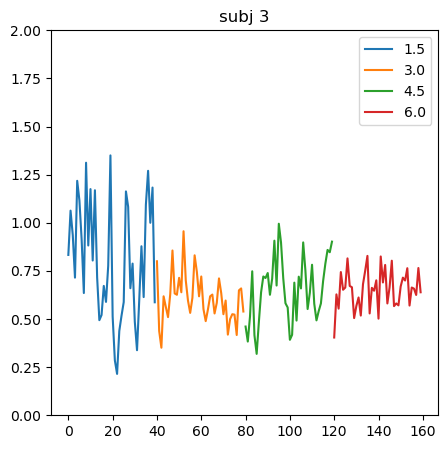

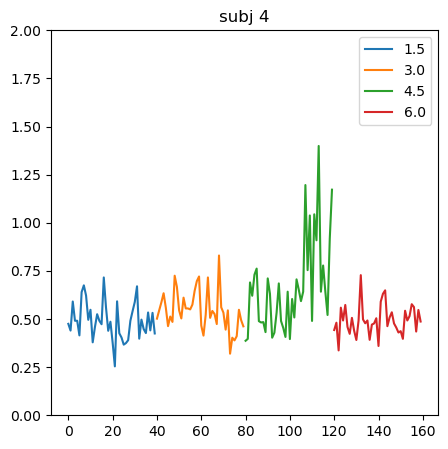

...

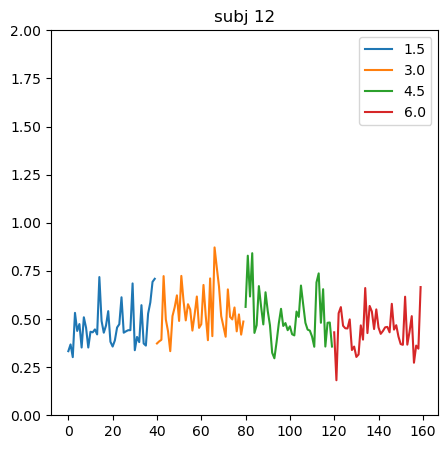

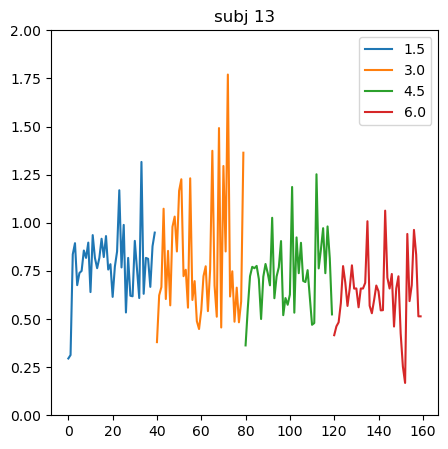

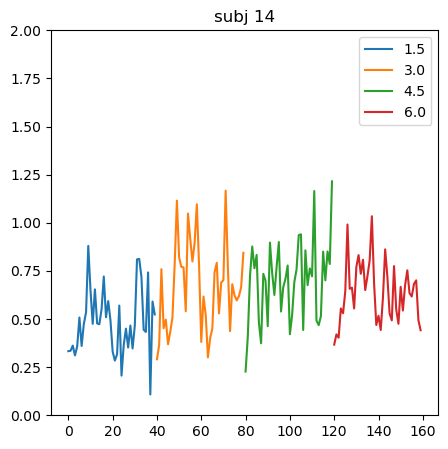

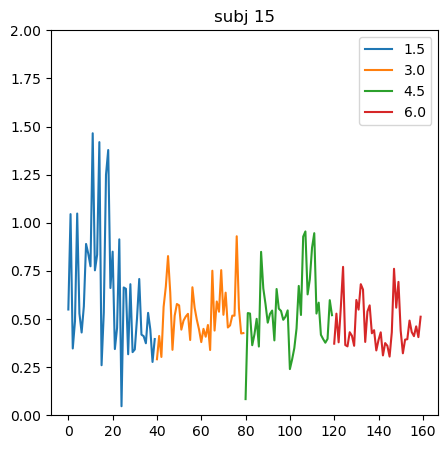

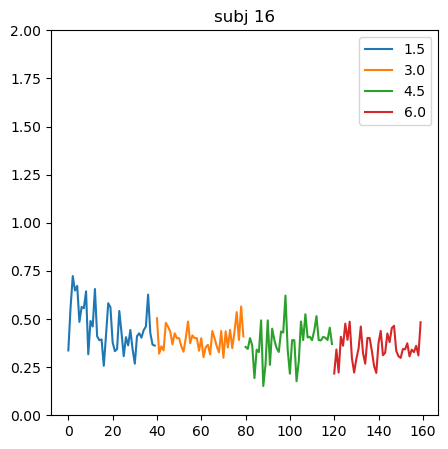

In [42]:
# Traitement des anomalies
for i in range(len(data_l_clean)):
    fig =plt.figure(figsize=(5, 5))
    grouped = data_l_clean[i].groupby('noise_lvl')['RT'].plot(legend = True)
    plt.title(f'subj {i}')
    plt.ylim(0,2)

In [43]:
for elem in data_l_clean:
    print(elem['RT'].min(), elem['RT'].max())

0.099 0.684
0.061 1.158
0.127 1.084
0.215 1.35
0.254 1.399
0.023 0.442
0.038 1.398
0.173 1.361
0.152 0.672
0.245 1.137
0.205 1.111
0.355 0.889
0.182 0.872
0.168 1.77
0.108 1.215
0.047 1.465
0.152 0.723


In [44]:
# def normalize_slope_values(data_list):
#     for data in data_list:
#         min_slope = min(data['slope'])
#         max_slope = max(data['slope'])
#         data['slope'] = -1 + 2 * (data['slope'] - min_slope) / (max_slope - min_slope)
#     return data_list

In [9]:
data_grouped = []
def group_data(data_list):
#     data_grouped = []
    for elem in data_list:
        grouped = elem.groupby(['noise_lvl', 'slope'])['prop_left','acc','RT'].mean().reset_index()
        data_grouped.append(grouped)
        
    return data_grouped     

In [10]:
data_gr = group_data(data_l_clean)

In [47]:
# for i in range(len(data_gr)):
    
#     data_gr[i].to_csv(f'mean_prop_subj_{i}.csv', sep=';')

In [48]:
data_gr[0][data_gr[0]['noise_lvl'] == 1.5]['RT'].mean()

0.419021645021645

In [49]:
# for i in range(len(data_l_clean)):
    
#     data_l_clean[i].to_csv(f'exp_2_subj_{i}.csv', sep=';')

In [11]:
mean_rt = []
sd_rt = []
for elem in data_l_clean:
    mean_rt.append(elem.groupby("noise_lvl")['RT'].mean())
    sd_rt.append(elem.groupby("noise_lvl")['RT'].std())
mean_df_clean = pd.concat([pd.DataFrame(mean_rt,index = np.array(range(len(mean_rt)))), pd.DataFrame(sd_rt,index = np.array(range(len(mean_rt))))], axis=1)
mean_df_clean.set_axis(["lvl_1_mean", "lvl_2_mean",'lvl_3_mean','lvl_4_mean',
                        "lvl_1_std", "lvl_2_std",'lvl_3_std','lvl_4_std'],axis=1,inplace=True)

In [12]:
mean_acc = []

for elem in data_l_clean:
    mean_acc.append(elem.groupby("noise_lvl")['acc'].mean())


In [20]:
mean_df_clean

,lvl_1_mean,lvl_2_mean,lvl_3_mean,lvl_4_mean,lvl_1_std,lvl_2_std,lvl_3_std,lvl_4_std
0,0.422775,0.548900,0.484725,0.622875,0.149969,0.173163,0.085338,0.219977
1,0.396571,0.542000,0.540700,0.441275,0.153404,0.115532,0.364365,0.202296
2,0.423225,0.375375,0.524075,0.379425,0.126088,0.137944,0.113922,0.129422


In [21]:
mean_df_clean.describe()

,lvl_1_mean,lvl_2_mean,lvl_3_mean,lvl_4_mean,lvl_1_std,lvl_2_std,lvl_3_std,lvl_4_std
count,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
mean,0.414190,0.488758,0.516500,0.481192,0.143154,0.142213,0.187875,0.183898
std,0.015260,0.098253,0.028746,0.126538,0.014879,0.029052,0.153511,0.047999
min,0.396571,0.375375,0.484725,0.379425,0.126088,0.115532,0.085338,0.129422
25%,0.409673,0.458688,0.504400,0.410350,0.138028,0.126738,0.099630,0.165859
50%,0.422775,0.542000,0.524075,0.441275,0.149969,0.137944,0.113922,0.202296
75%,0.423000,0.545450,0.532388,0.532075,0.151687,0.155553,0.239143,0.211136
max,0.423225,0.548900,0.540700,0.622875,0.153404,0.173163,0.364365,0.219977


In [59]:
# for i in range(len(data_gr)):
    
#     data_gr[i].to_csv(f'mean_prop_subj_{i}.csv', sep=';')

In [60]:
# pd.set_option('display.max_rows', None)  # or 1000

In [13]:
def plot_simple_curve(data_list):
    for elem in range(len(data_list)):
        data= data_list[elem]
        # group by (noise_lvl) and distance from center (slope)
        grouped = data.groupby(['noise_lvl', 'slope'])['RT'].mean().reset_index()
        unique_noise_levels = grouped['noise_lvl'].unique()
        fig =plt.figure(figsize=(7, 5))
        for noise in unique_noise_levels:
            subset = grouped[grouped['noise_lvl'] == noise]
            slope_values = subset['slope']
            prop_left_values = subset['RT']
            plt.plot(slope_values, prop_left_values, marker='o', label=f'Noise lvl {noise}')
#             plt.scatter(slope_values, prop_left_values, label=f'Noise lvl {noise}', marker='o', s=30)
        plt.xlabel(' Distance from center')
        plt.ylabel('mean RT')
        plt.title(f'Psychometric Curve subj {elem}')
        plt.legend(title='Noise lvl')
        plt.grid(True)

        # plt.scatter(data['slope'], data['prop_left'], color='b', label='real', marker='x', s=30)
        plt.xticks(range(-10, 11, 1))
        plt.yticks(np.arange(0, 1, 0.1))

        plt.legend()
        plt.show()

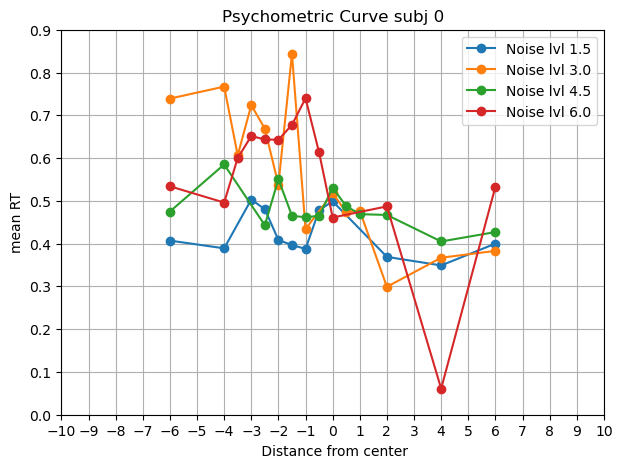

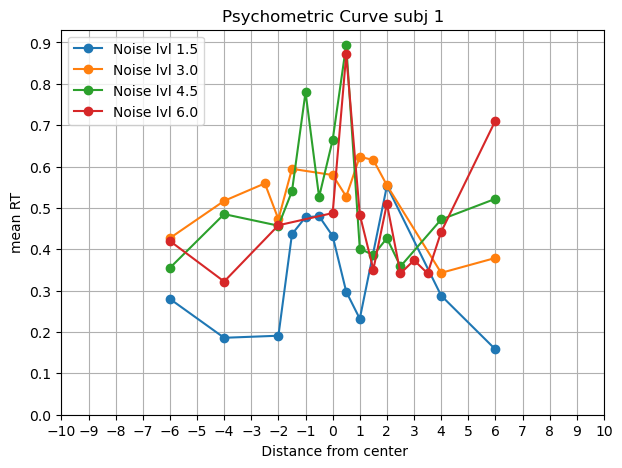

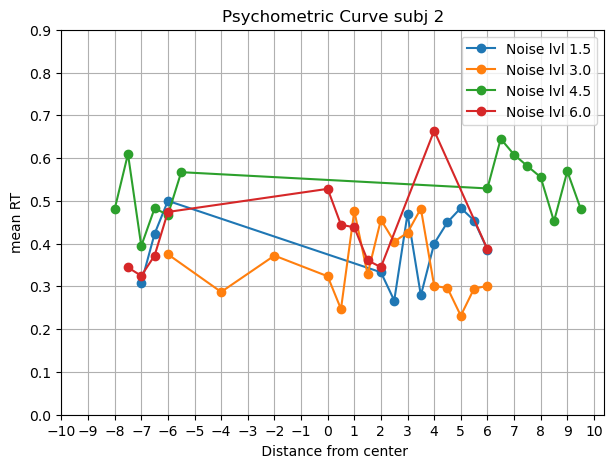

In [23]:
plot_simple_curve(data_l_clean)

In [14]:
def plot_simple_curve(data_list):
    for elem in range(len(data_list)):
        data= data_list[elem]
        # group by (noise_lvl) and distance from center (slope)
        grouped = data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()
        unique_noise_levels = grouped['noise_lvl'].unique()
        fig =plt.figure(figsize=(7, 5))
        for noise in unique_noise_levels:
            subset = grouped[grouped['noise_lvl'] == noise]
            slope_values = subset['slope']
            prop_left_values = subset['prop_left']
            plt.plot(slope_values, prop_left_values, marker='o', label=f'Noise lvl {noise}')
#             plt.scatter(slope_values, prop_left_values, label=f'Noise lvl {noise}', marker='o', s=30)
        plt.xlabel(' Distance from center')
        plt.ylabel('Proportion of "left" responses')
        plt.title(f'Psychometric Curve subj {elem}')
        plt.legend(title='Noise lvl')
        plt.grid(True)

        # plt.scatter(data['slope'], data['prop_left'], color='b', label='real', marker='x', s=30)
        plt.xticks(range(-10, 11, 1))
        plt.yticks(np.arange(0, 1, 0.1))

        plt.legend()
        plt.show()

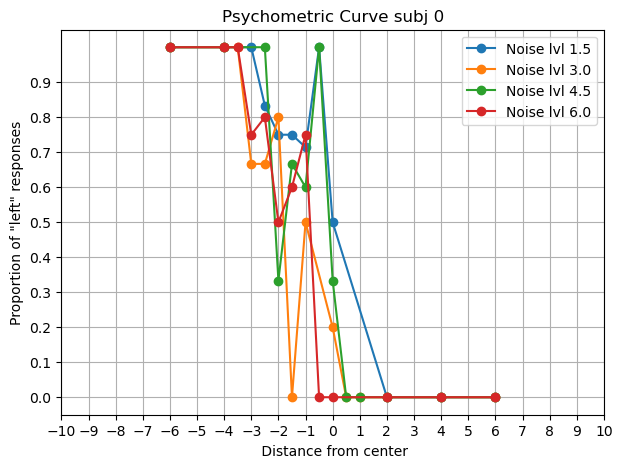

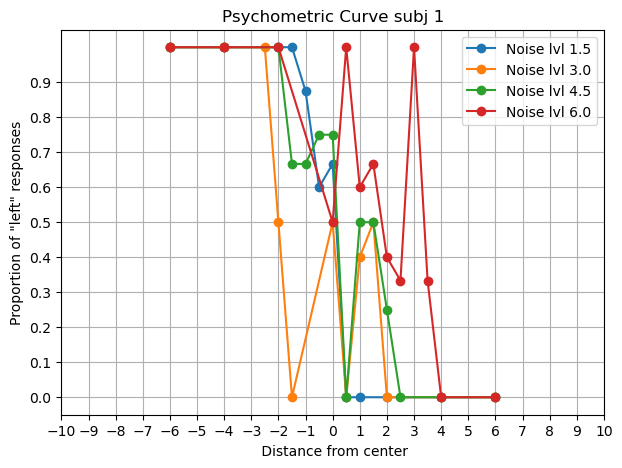

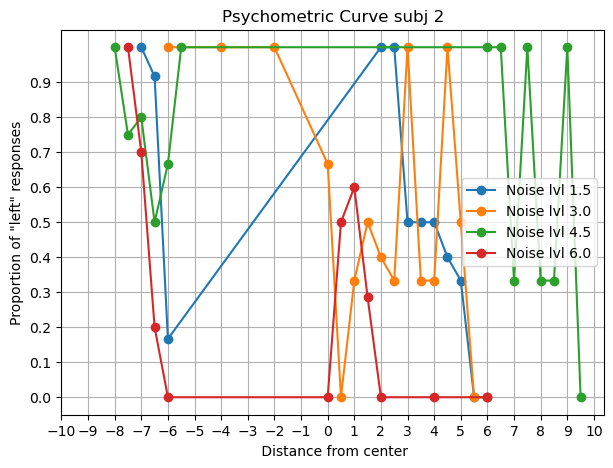

In [25]:
plot_simple_curve(data_l_clean)

In [15]:

def plot_staircase(data_list):
    for elem in range(len(data_list)):
        data= data_list[elem]
            
        unique_noise_levels = data['noise_lvl'].unique()
        fig, axes = plt.subplots(1, 4, figsize=(17, 4))  # Adjust the figsize as needed
        plt.suptitle(f"S {elem}",fontsize=15)
        data_grouped = data.groupby('noise_lvl')
        # Define a threshold value for distinguishing the two sets of data
        threshold = 20
        for i, (noise, group) in enumerate(data_grouped):
            slope_values = group['slope']
            prop_left_values = group['prop_left']
            # Separate the data into two sets based on the threshold
            slope_values_start = slope_values.iloc[:threshold]
            slope_values_other = slope_values.iloc[threshold:] 
            # Select the appropriate subplot
            ax = axes[i]
            ax.plot(slope_values_start, 'o-', color='k',   linewidth=1.5, markersize=4, )
            ax.plot(slope_values_other, 'o-', color='k',   linewidth=1.5, markersize=4, )
            ax.axhline(y=0, color='k', linestyle='--')
            ax.set_title(f'Staircase for Noise lvl {noise}', fontsize=14)
            ax.set_xlabel('Trial', fontsize=15)
            ax.set_ylabel('Slope', fontsize=15)
            ax.grid(True, linestyle='--', alpha=0.6)        
    # Adjust the spacing between subplots
        plt.tight_layout()
        # Display the plot
        plt.show()

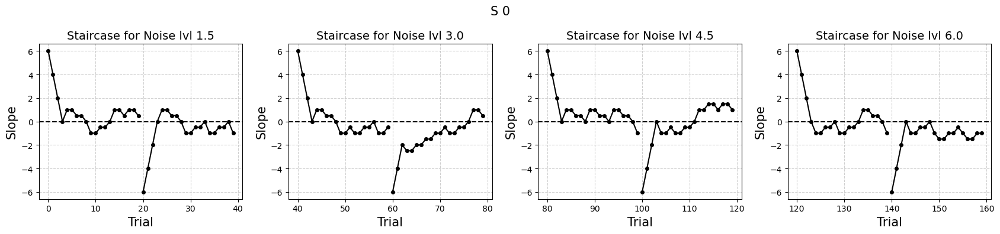

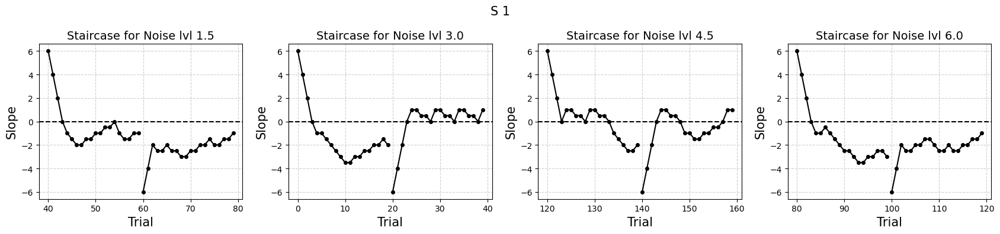

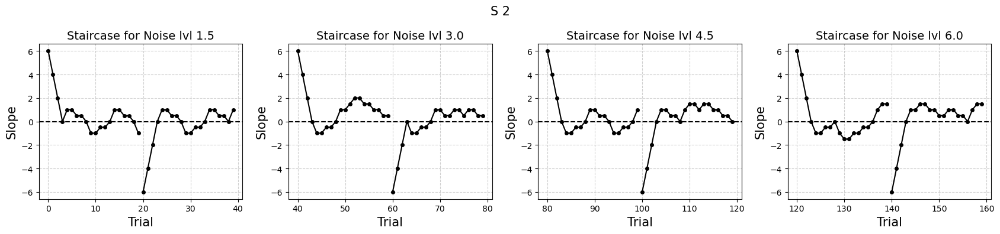

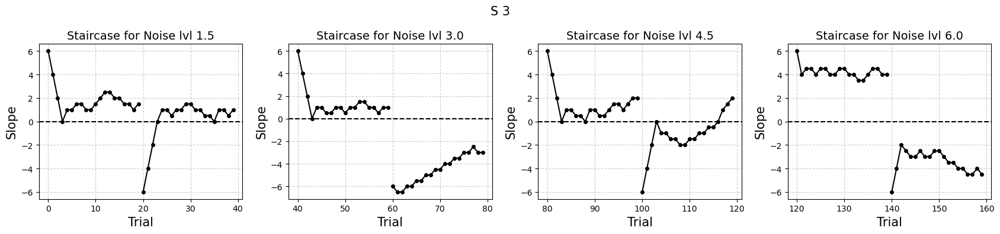

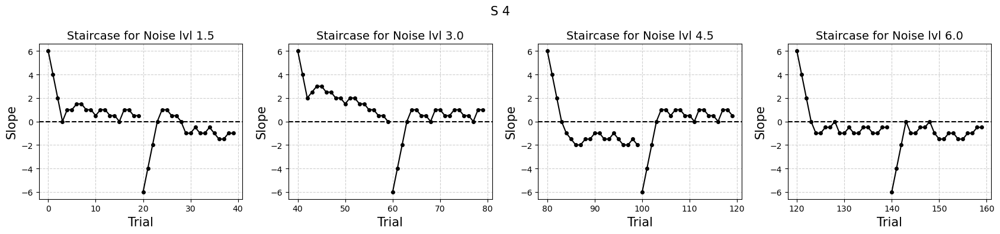

...

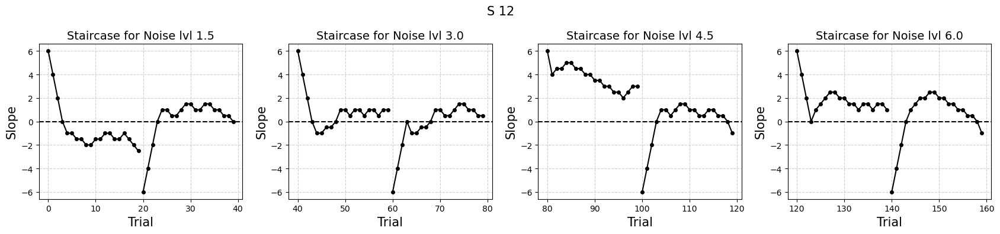

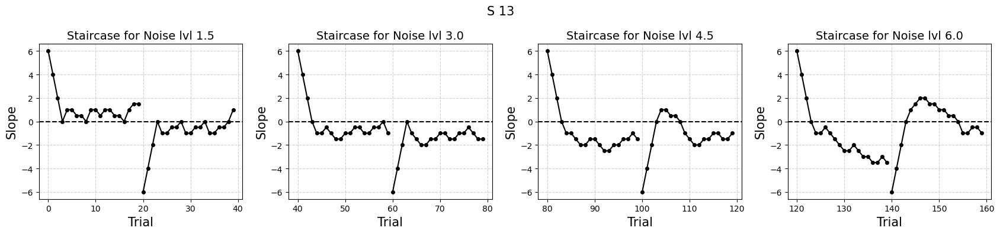

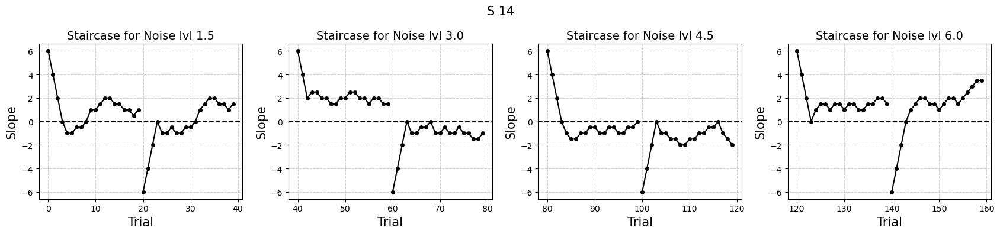

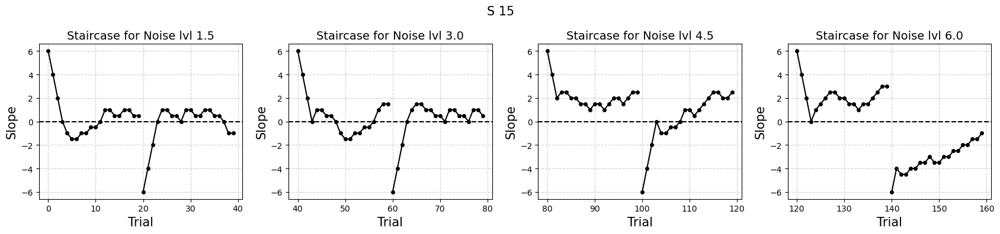

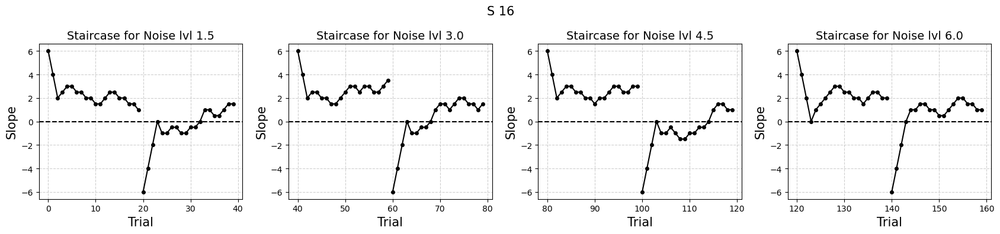

In [16]:
plot_staircase(data_l_clean)

In [37]:
import matplotlib.pyplot as plt

def plot_staircase(data_list):
    for elem in range(len(data_list)):
        data = data_list[elem]
        
        unique_noise_levels = data['noise_lvl'].unique()
        fig, axes = plt.subplots(2, 2, figsize=(10, 8))  # Creating 2x2 subplots
#         plt.suptitle(f"Subject {elem} Staircase Plots", fontsize=15, fontname="Times New Roman")
        
        data_grouped = data.groupby('noise_lvl')
        threshold = 20  # Define a threshold for data separation
        
        axes = axes.flatten()  # Flatten the array to index it easier
        for i, (noise, group) in enumerate(data_grouped):
            if i < 4:  # Ensure we don't index beyond the number of subplots
                slope_values = group['slope']
                # Separate the data into two sets based on the threshold
                slope_values_start = slope_values.iloc[:threshold]
                slope_values_other = slope_values.iloc[threshold:]
                
                ax = axes[i]
                # Plot initial and other parts in gray
                line1, = ax.plot(slope_values_start, 'o-', color='gray', linewidth=1.5, markersize=4, label=f'Noise {noise}')
                line2, = ax.plot(slope_values_other, 'o-', color='gray', linewidth=1.5, markersize=4)
                ax.axhline(y=0, color='k', linestyle='--', alpha=0.6)
                ax.set_xlabel('Trial', fontsize=15, fontname="Times New Roman")
                ax.set_ylabel('Distance from \n screen center (deg)', fontsize=15, fontname="Times New Roman")
                ax.grid(True, linestyle='--', alpha=0.6)
                # Adding legend to the subplot
                ax.legend(fontsize=12, frameon=False, loc='best')
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the title
        plt.show()
plot_staircase(data_l_clean)

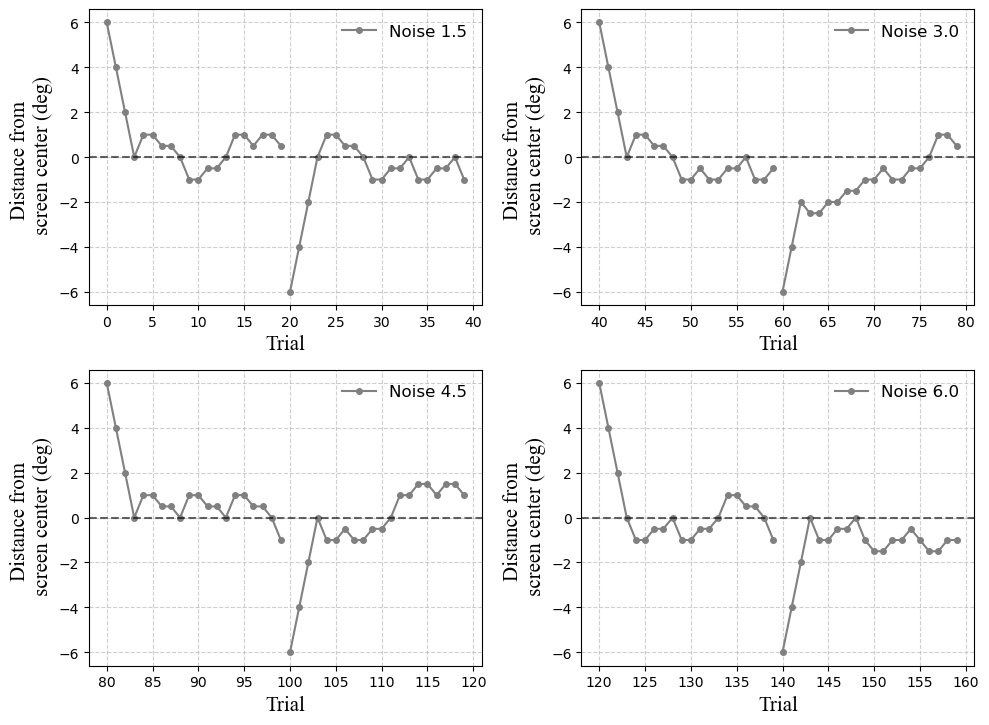

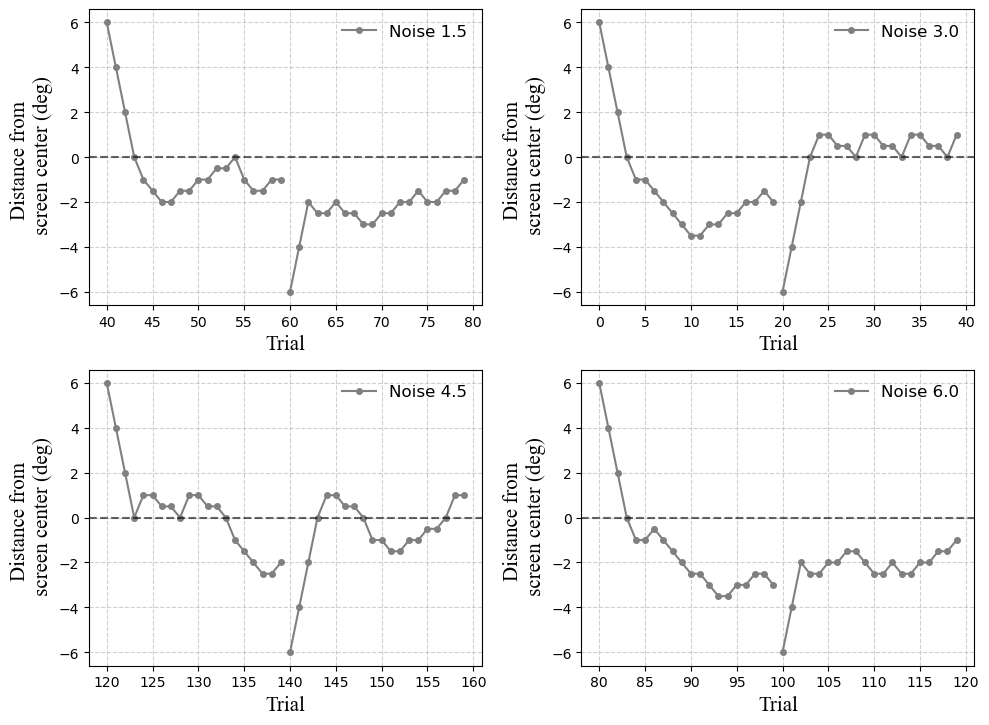

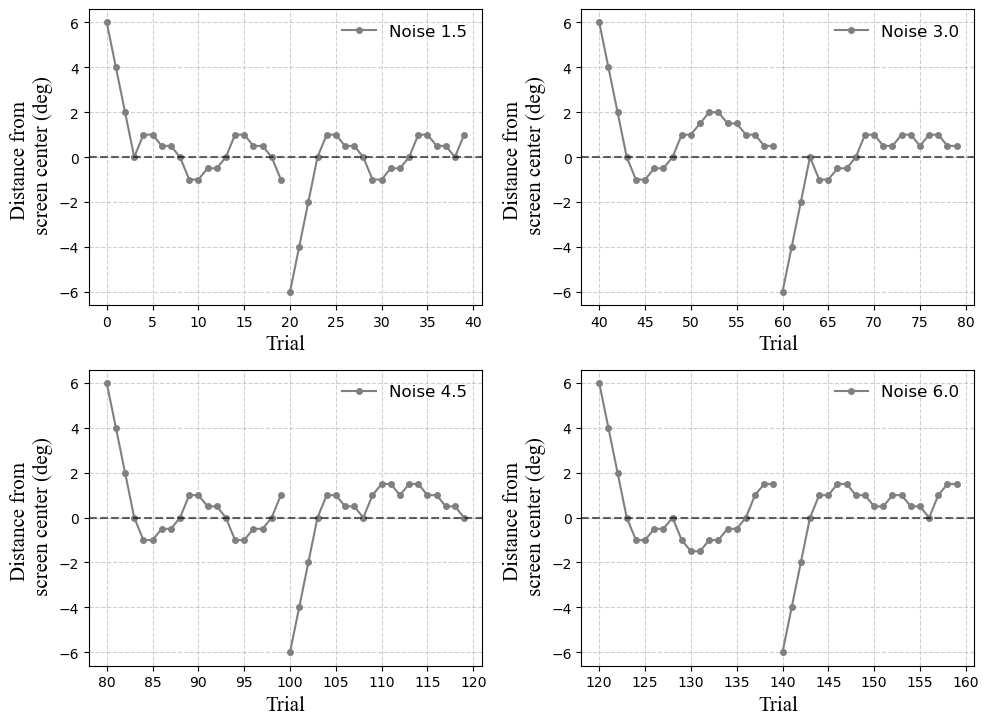

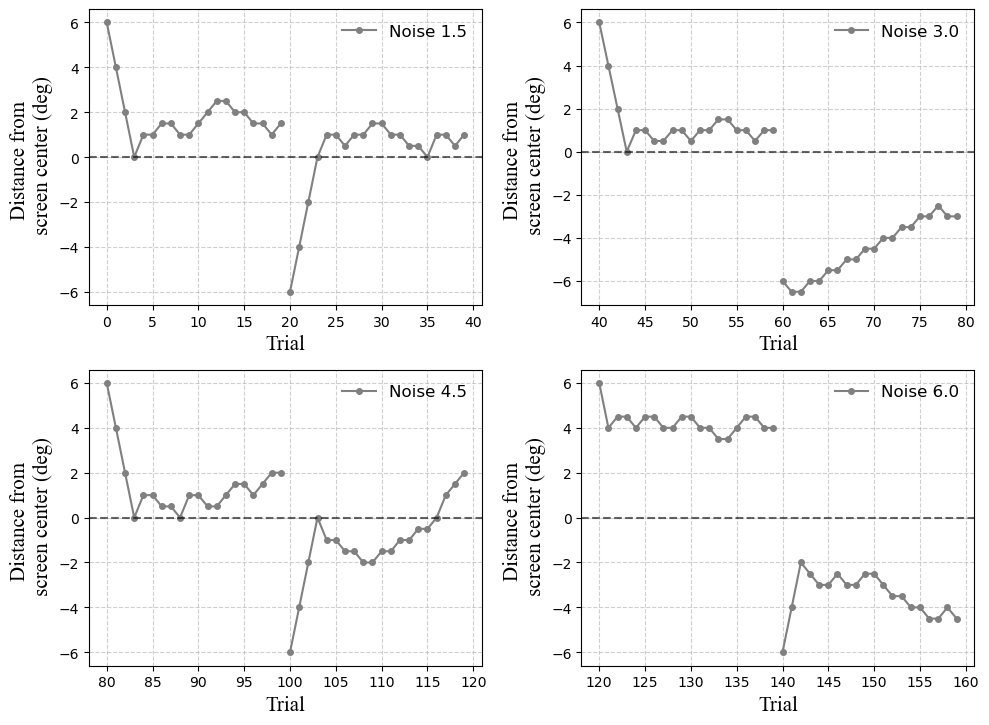

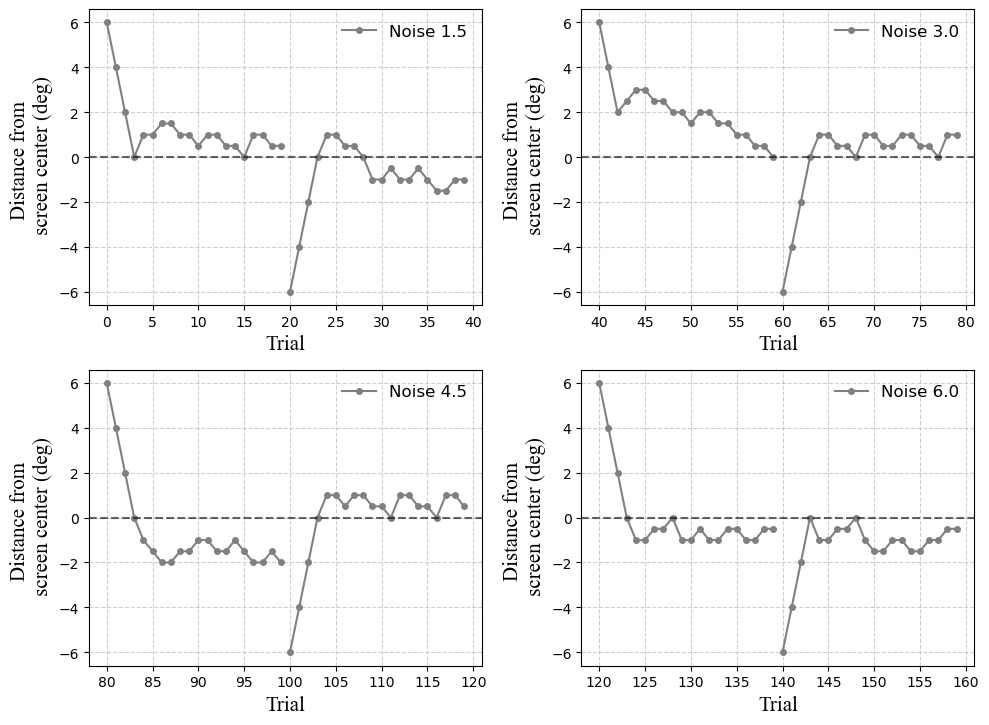

...

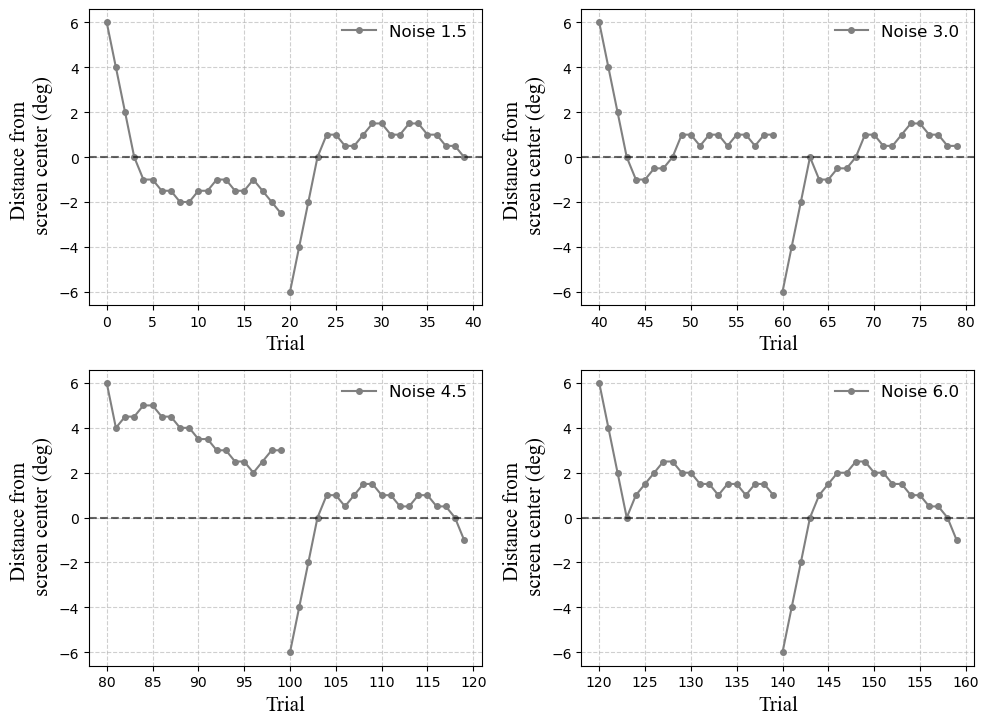

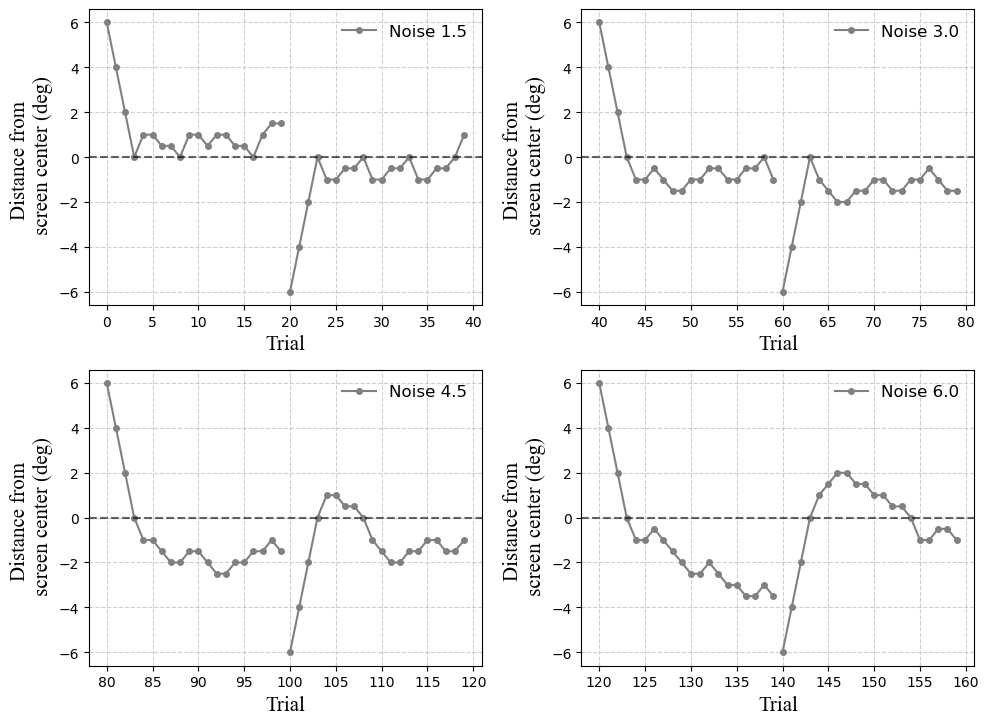

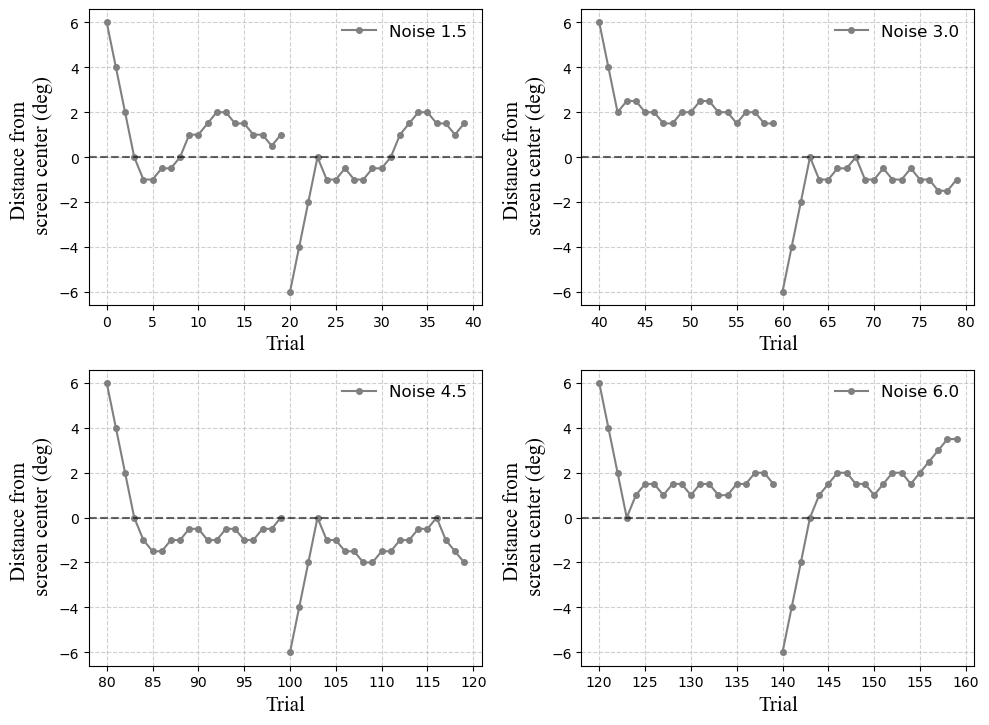

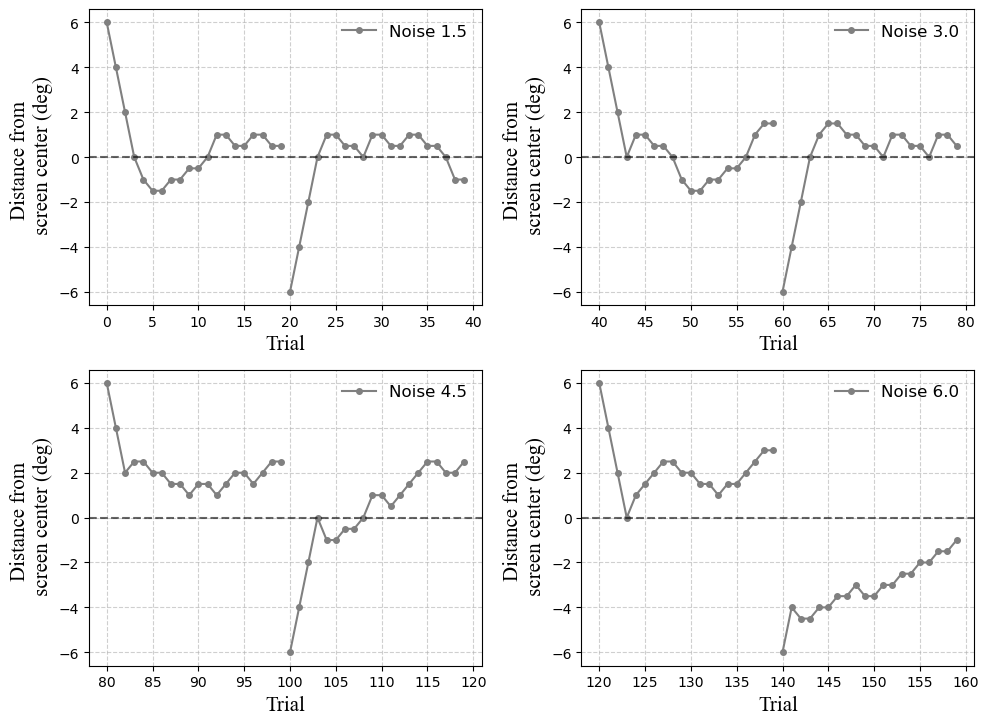

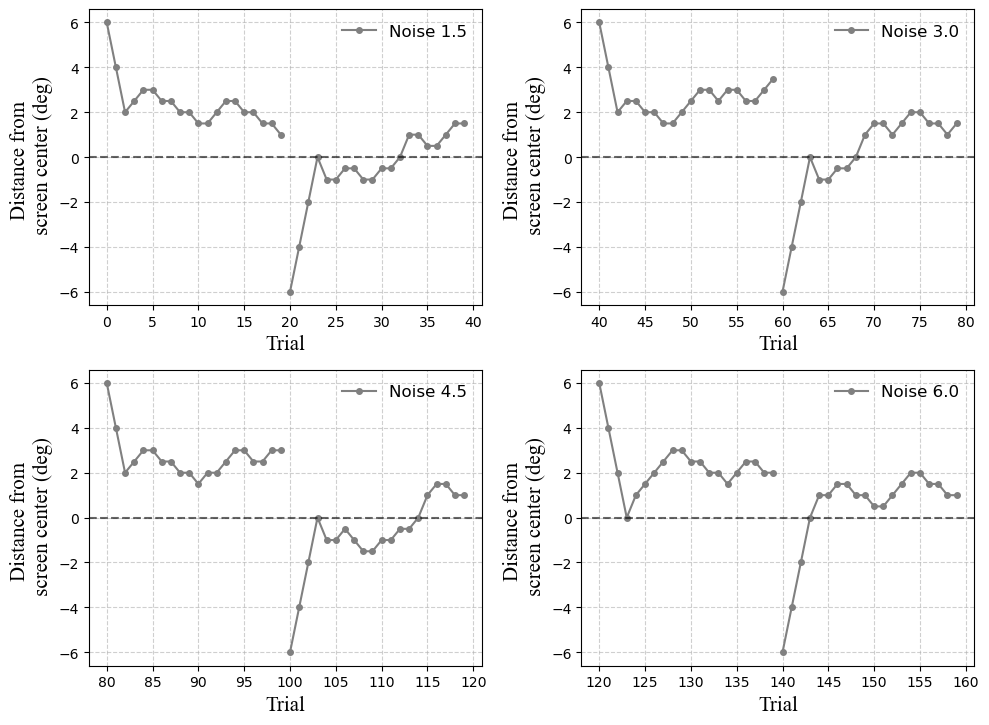

In [38]:
plot_staircase(data_l_clean)

In [12]:
data_csv =  sorted(str(p) for p in pathlib.Path("C:\\Users\\USER\\Desktop\\Paris Saclay\\These\\4_DATA\\data_exp_2_pf\\1_data_clean_v1\\mean_prop").glob("*.csv"))

# data_csv = data_csv[1:-1]
print(len(data_csv))

data_csv = sorted(data_csv , key=lambda x: int(x.split('_')[-1].split('.')[0]))


17


In [13]:
def data_list (data_csv):
    data_l = []
    for elem in data_csv:
        data = pd.read_csv(elem, header=0, sep=';')
        data_l.append(data)
    return data_l
data_l =  data_list(data_csv)

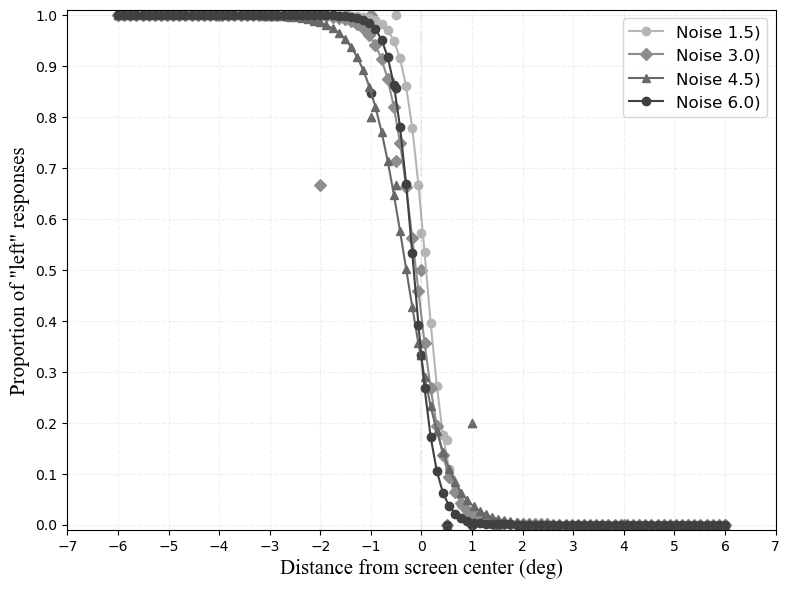

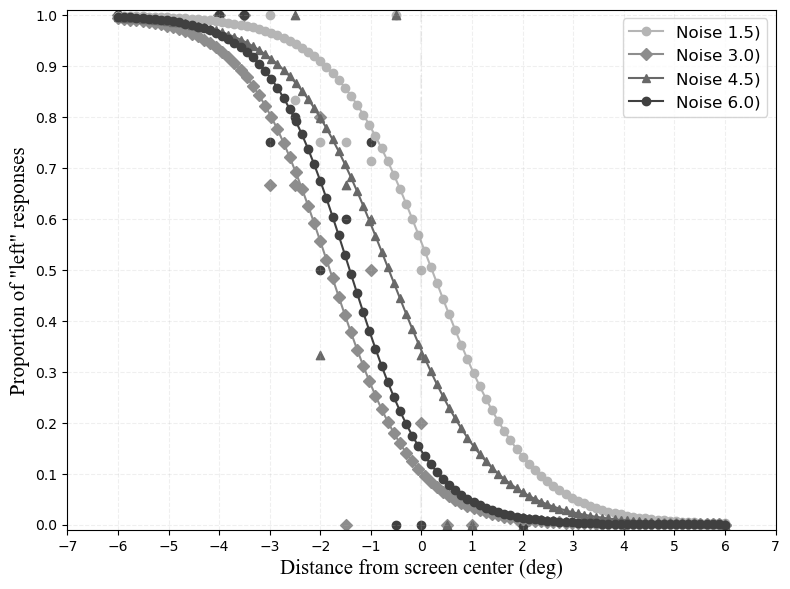

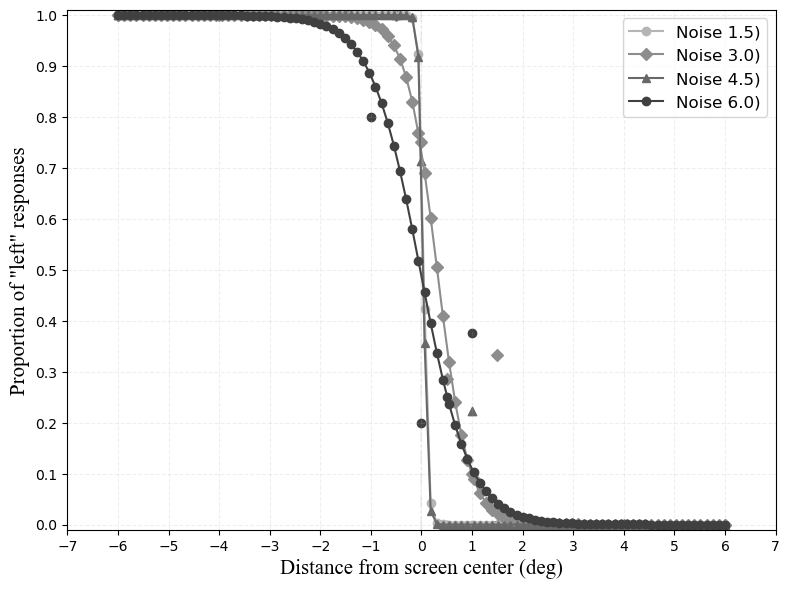

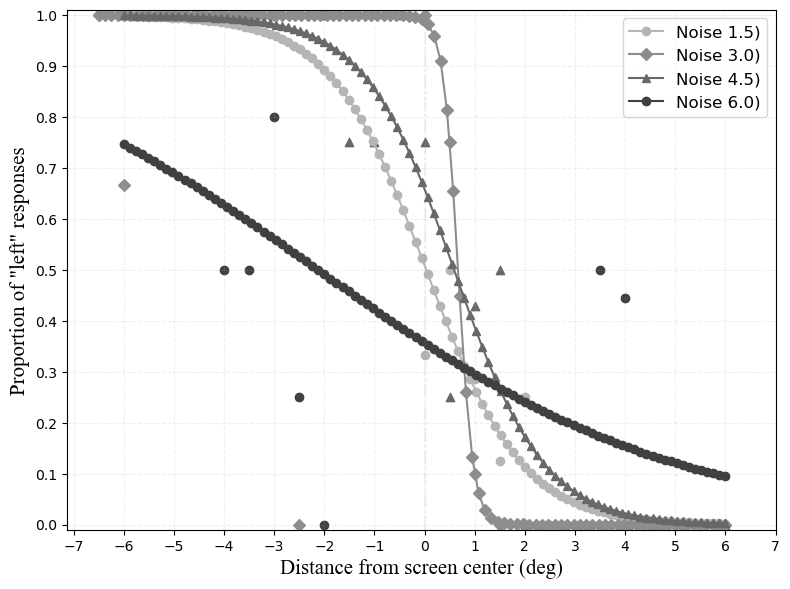

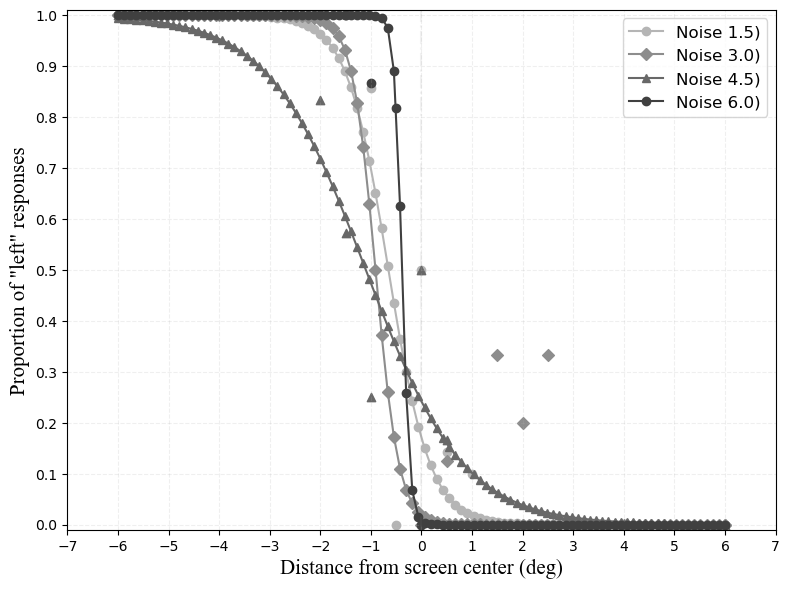

...

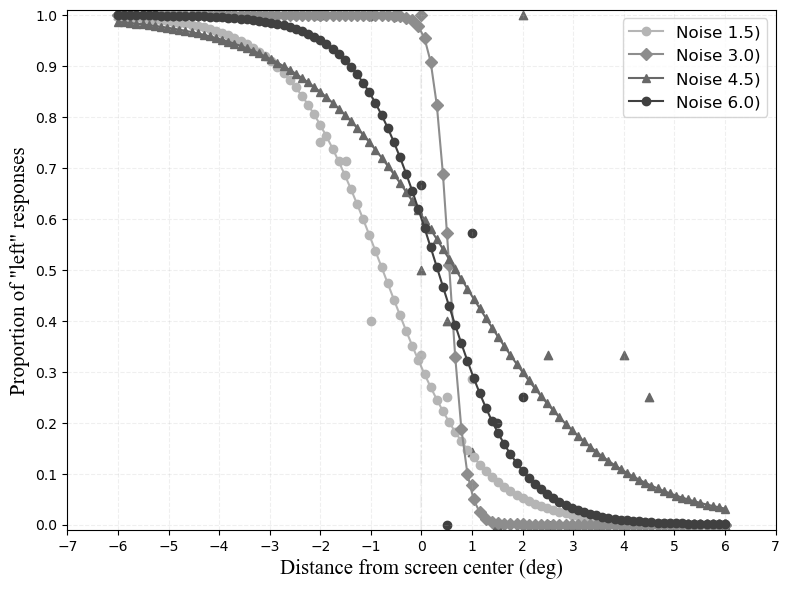

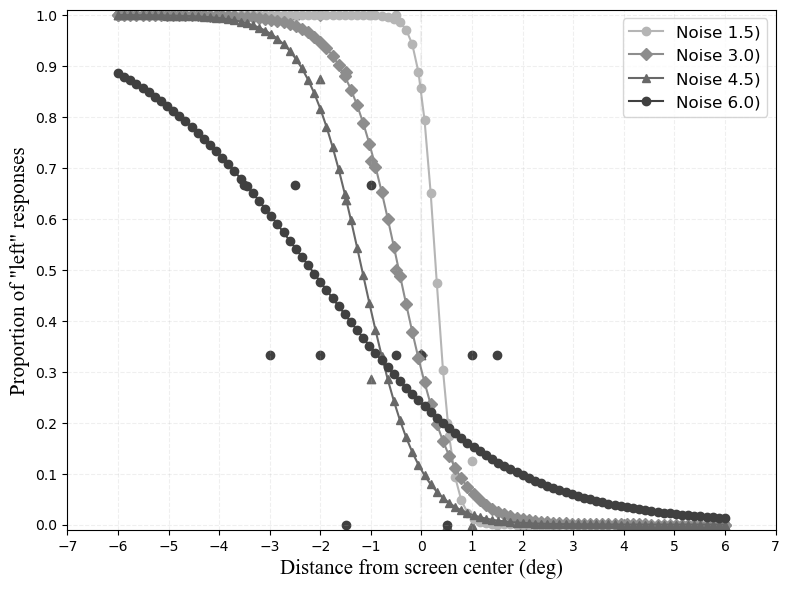

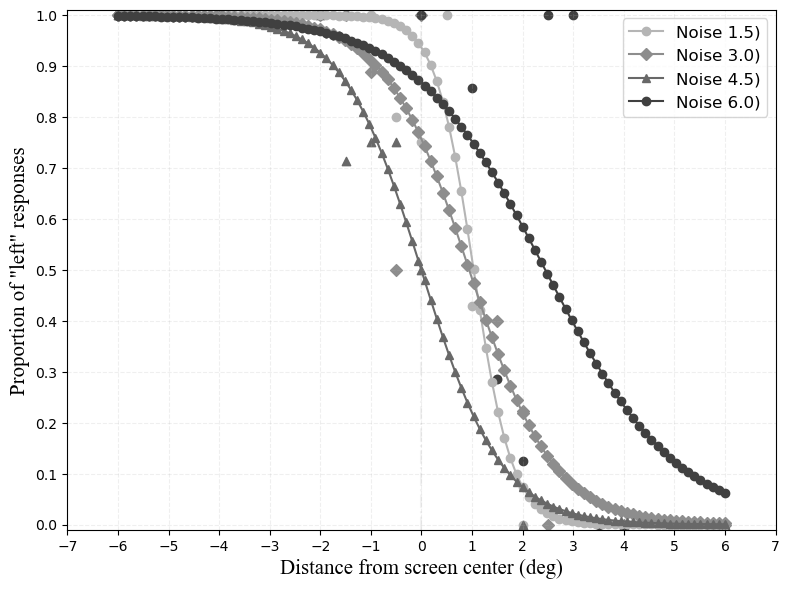

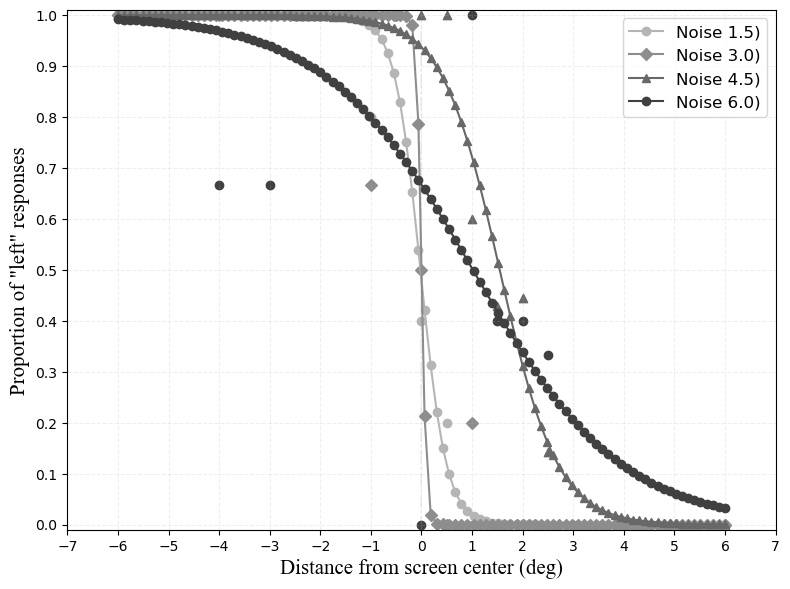

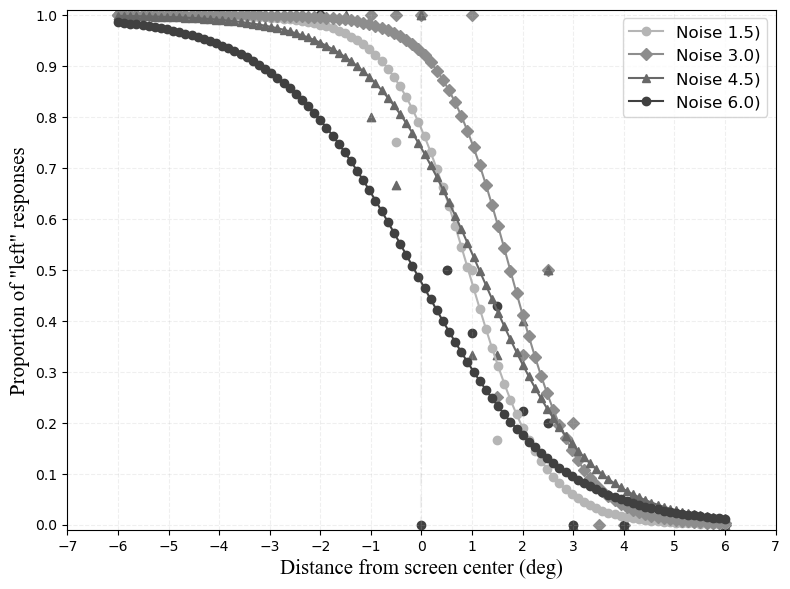

In [14]:
# Define the psychometric function
def psychometric_function(stimulus, PSE, JND):
    return 1 / (1 + np.exp((stimulus - PSE) / JND)) ## threshold, slope = PSE, JND

markers = ['o', 's', 'D', '^', 'v']
# Iterate through each participant's data
for elem, data in enumerate(data_l):
    grouped = data.groupby('noise_lvl')
    fig, ax = plt.subplots(figsize=(8,6))
#     plt.title(f'Psychometric Curves for Subject {elem }')
    
    unique_noise_levels = sorted(data['noise_lvl'].unique())
    color_scale = np.linspace(0.4, 0.8, len(unique_noise_levels))
    
    # Iterate through each noise level
#     for noise_lvl, data_group in grouped:
    for idx, (noise_lvl, data_group) in enumerate(grouped):
        RT = data_group['RT'].mean()
        Acc = data_group['acc'].mean()

        x_data = data_group['slope']
        y_data = data_group['prop_left']
        popt, _ = curve_fit(psychometric_function, x_data, y_data, p0=(0, 0.5), method='trf', bounds=([-np.inf, 0], [np.inf, np.inf]))
#         popt, _ = curve_fit(psychometric_function, x_data, y_data, p0=(0, 1))
        PSE, JND = popt

        ### PLOTTING #######
        i = int(noise_lvl)-1
        x_values = np.linspace(min(data_group['slope']), max(data_group['slope']), 100)
        y_values = psychometric_function(x_values, PSE, JND)
#         color = plt.cm.Greys(i/ len(unique_noise_levels))
        color = plt.cm.Greys(noise_lvl / len(data['noise_lvl'].unique()))
        color = plt.cm.Greys(color_scale[idx])
        
#         colors = plt.cm.Greys(np.linspace(0.3, 0.9, len(params)))
        marker = markers[i % len(markers)]
#         label = f'Noise {noise_lvl} (PSE={PSE:.2f}, JND={JND:.2f})'
        label = f'Noise {noise_lvl})'
        ax.plot(x_values, y_values, label=label, color=color, marker=marker, markersize=6)
        ax.scatter(x_data, y_data, color=color, marker=marker,)
    
    plt.ylim(-0.01, 1.01)
    plt.xticks(np.arange(-7, 8, 1))
    plt.yticks(np.arange(0, 1.1, 0.1))
    plt.xlabel('Distance from screen center (deg)', fontsize=15,fontname="Times New Roman")
    plt.ylabel('Proportion of "left" responses', fontsize=15,fontname="Times New Roman")
    plt.axvline(x=0, color='gray', linestyle='-.', alpha=0.1)
#     plt.axhline(y=0.5, color='gray', linestyle='-.', alpha=0.5)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.2)
    plt.tight_layout()

    plt.show()   


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


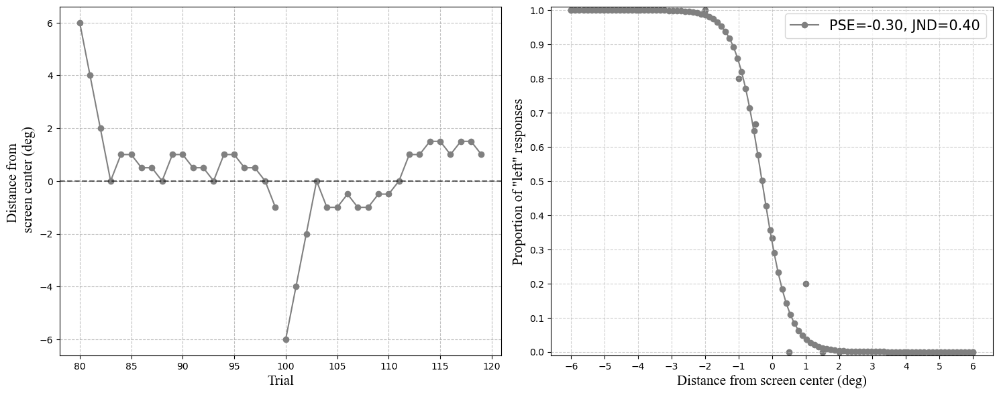

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


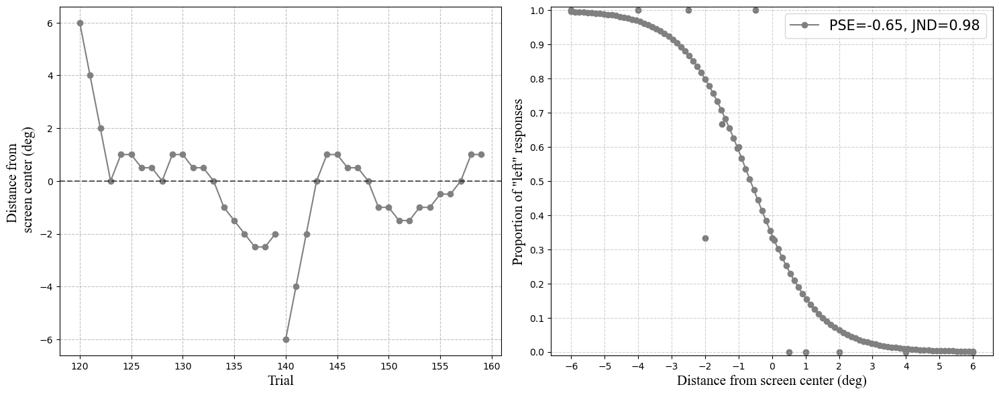

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


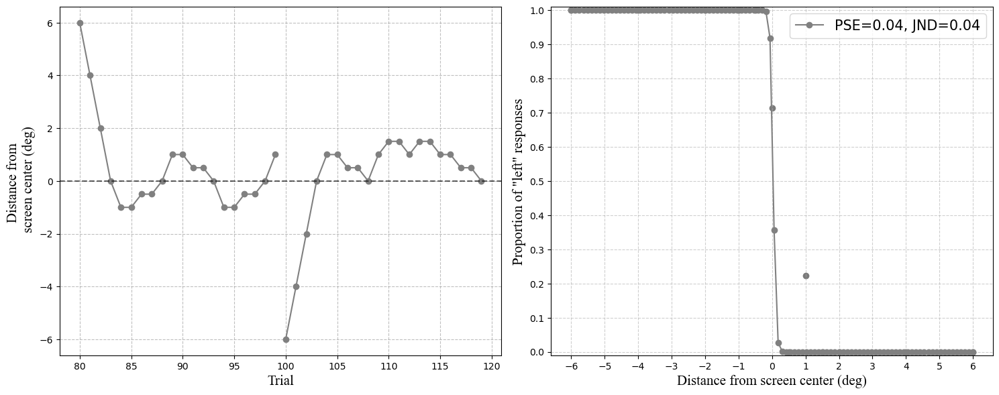

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


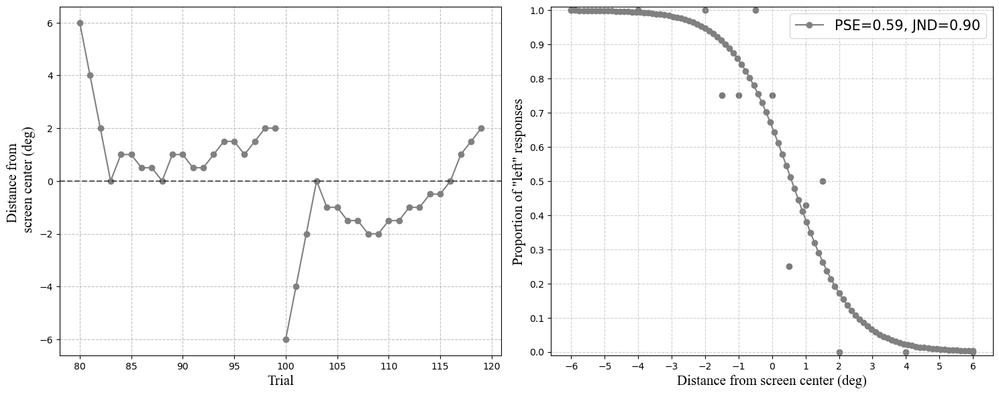

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


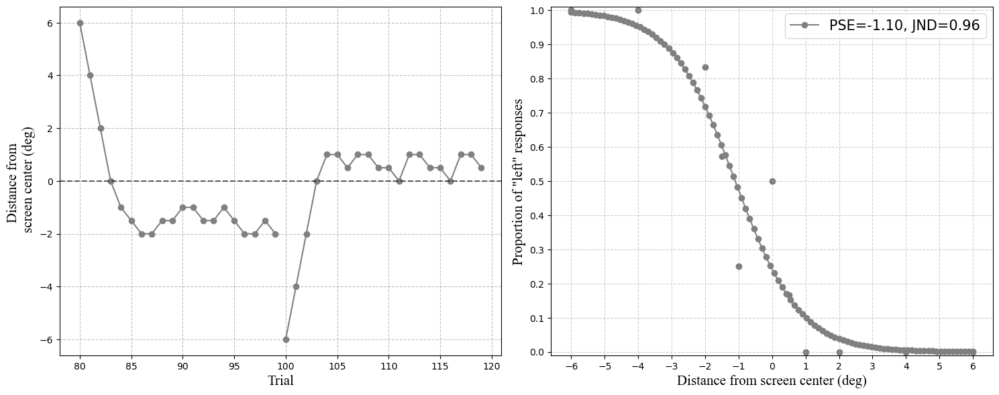

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


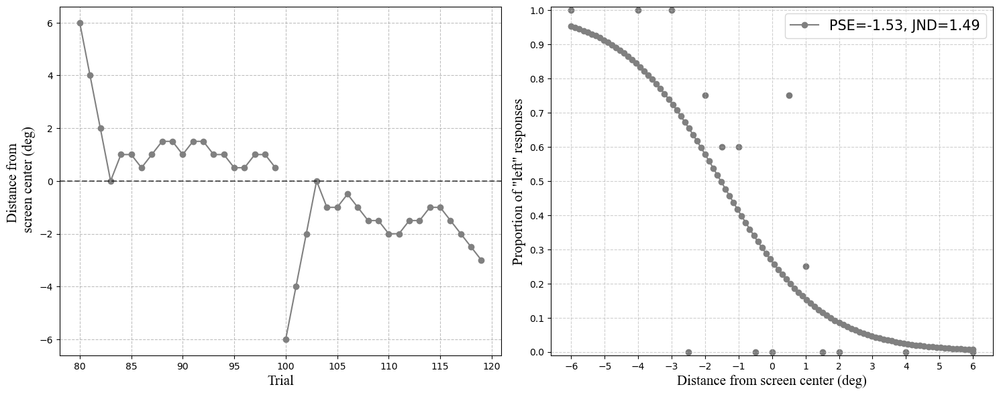

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


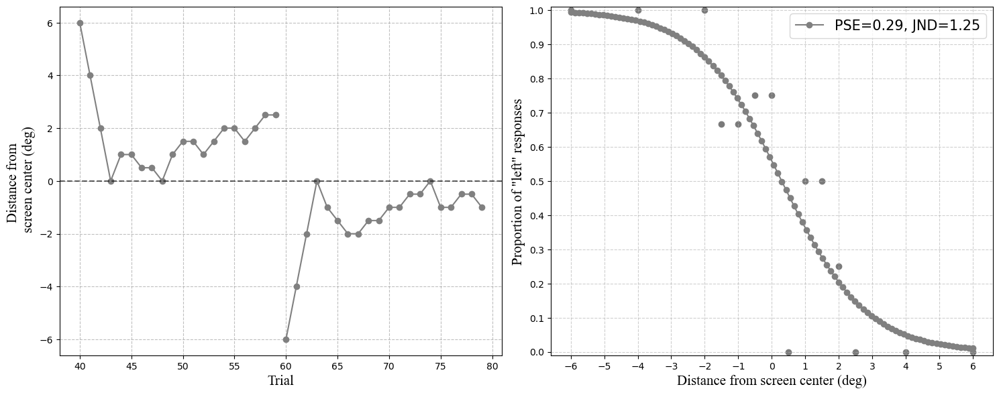

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


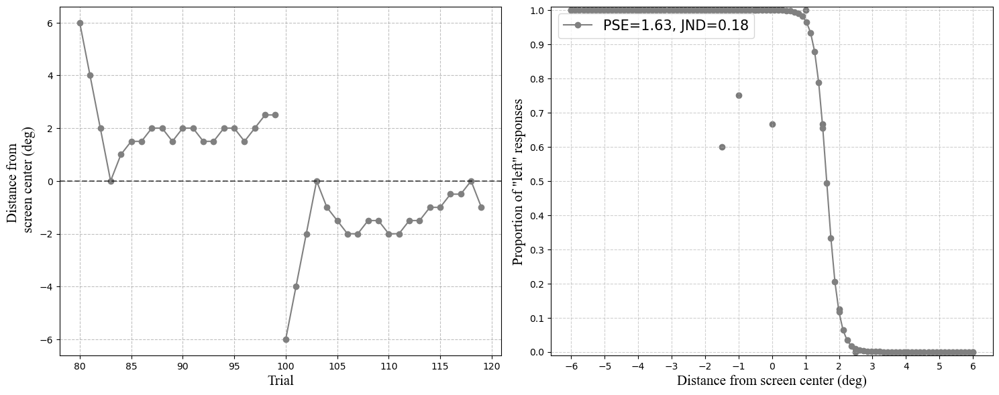

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


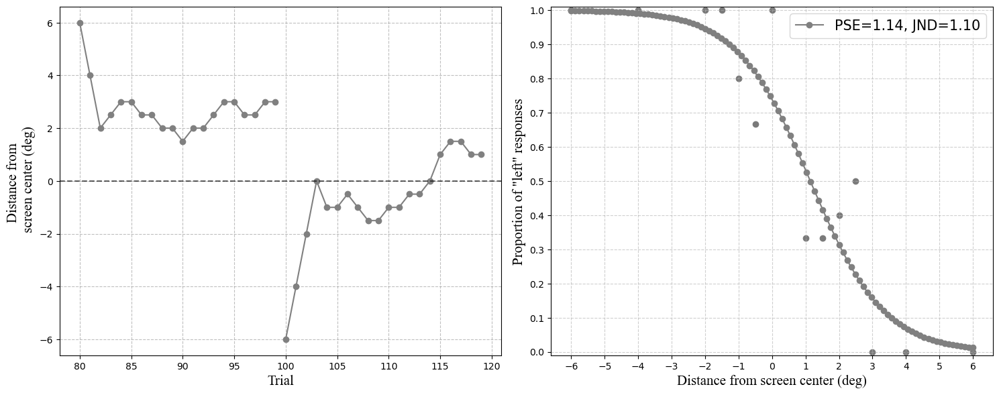

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


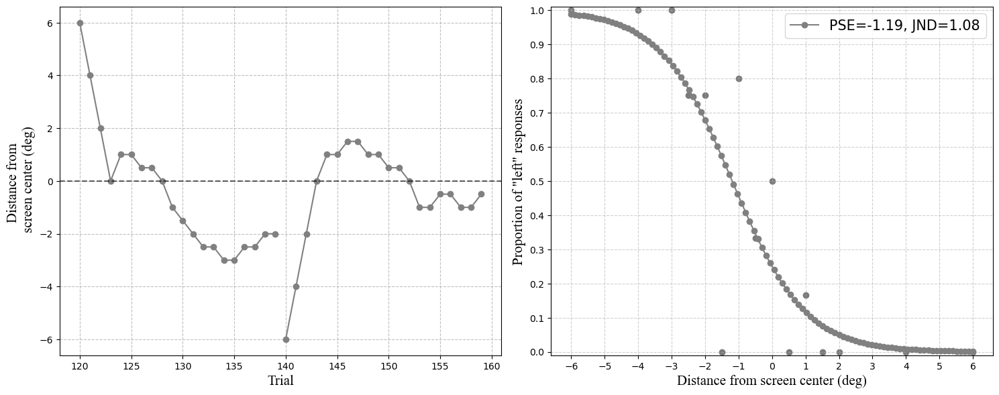

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


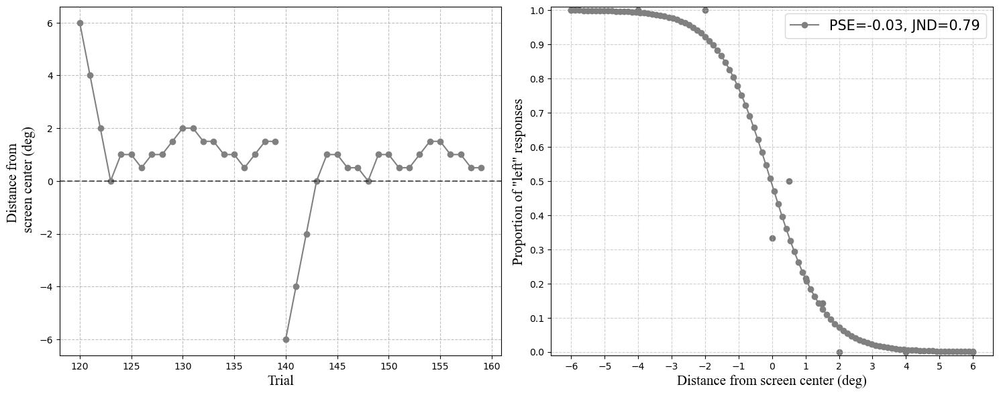

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


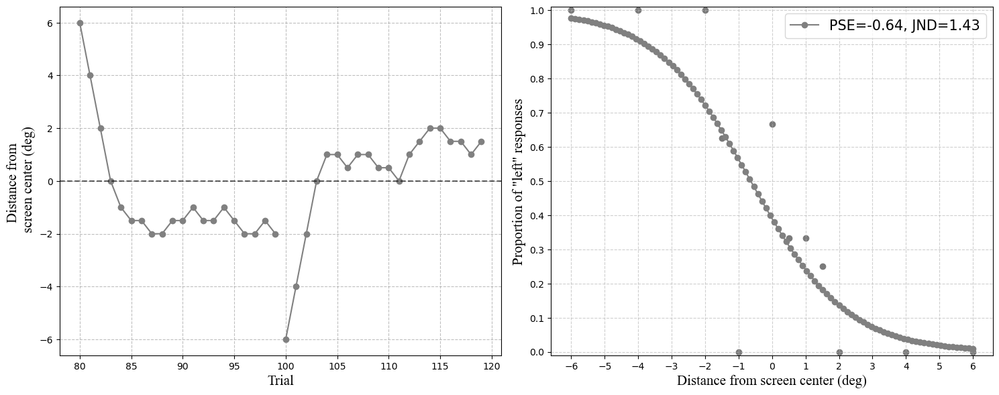

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


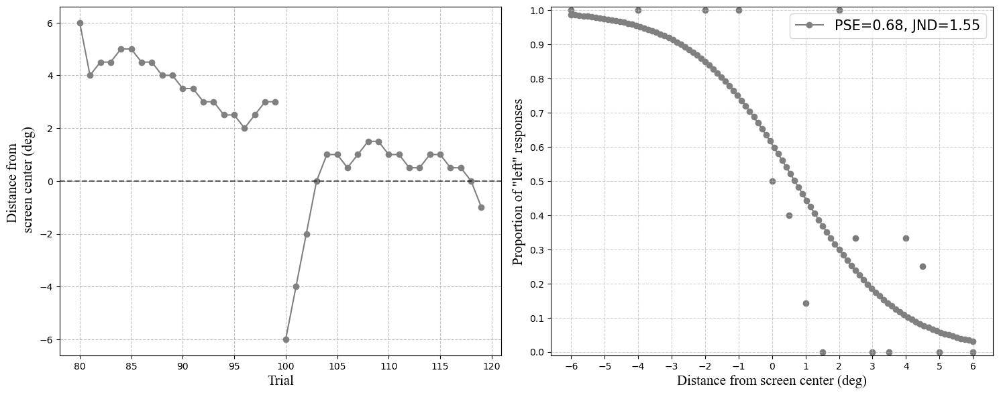

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


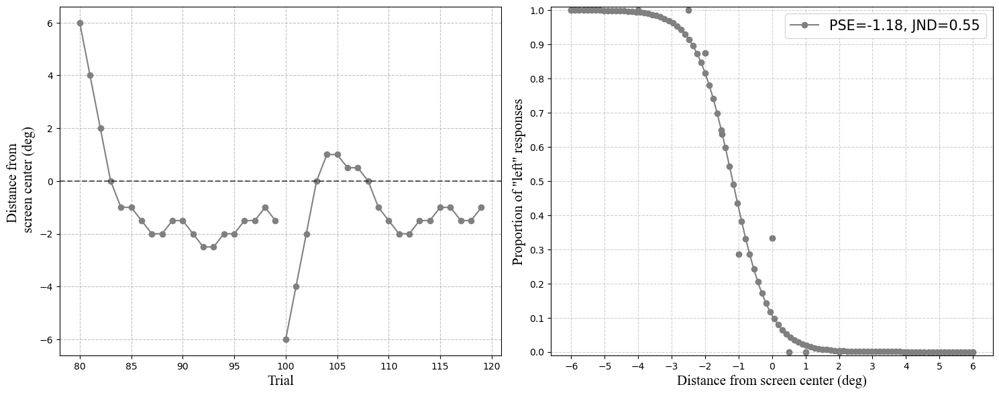

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


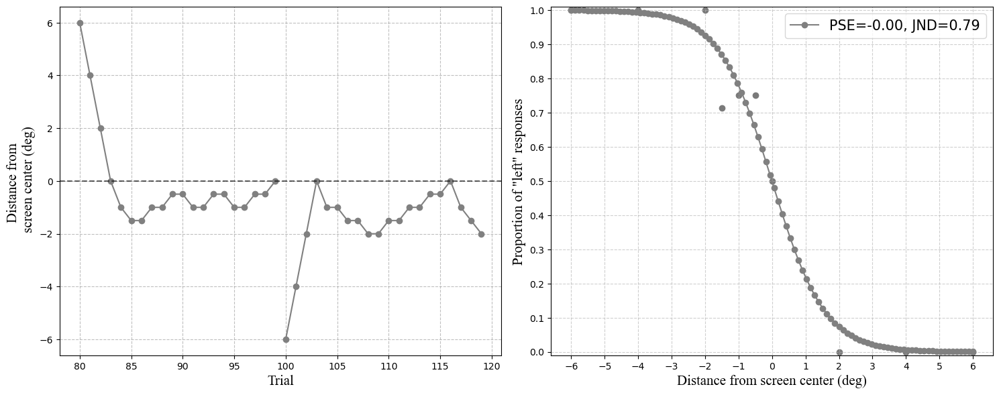

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


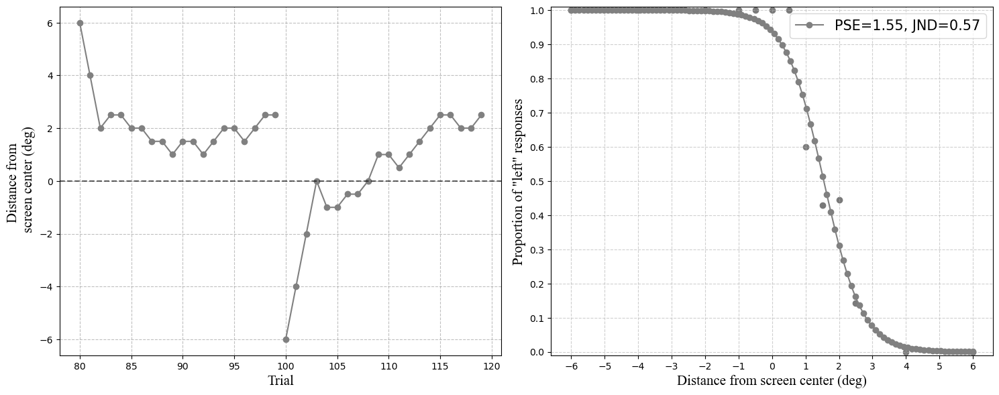

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


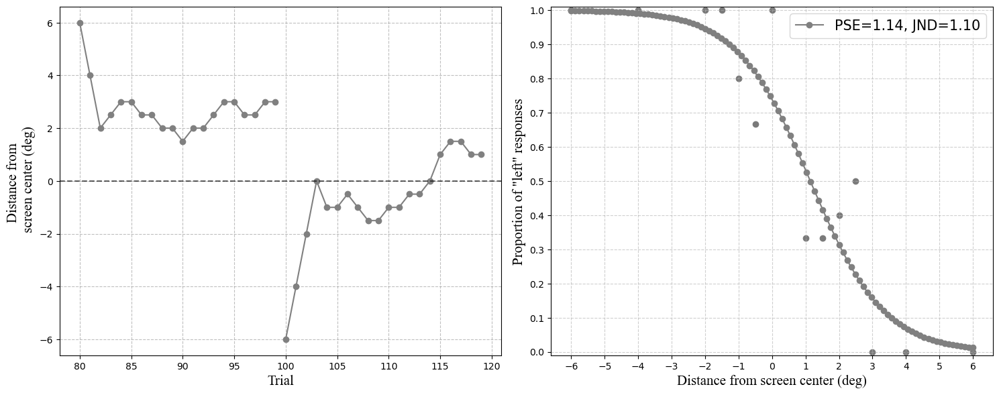

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def psychometric_function(stimulus, PSE, JND):
    return 1 / (1 + np.exp((stimulus - PSE) / JND))

def plot_filtered_graphs(data_list_clean, data_list, target_noise_level=4.5):
    markers = ['o', 's', 'D', '^', 'v']
    
    for elem, (data_clean, data) in enumerate(zip(data_list_clean, data_list)):
        # Filter data for the specific noise level
        data_clean_filtered = data_clean[data_clean['noise_lvl'] == target_noise_level]
        data_filtered = data[data['noise_lvl'] == target_noise_level]

        if data_clean_filtered.empty or data_filtered.empty:
            continue  # Skip this loop iteration if there is no data for the target noise level
        
        fig, axes = plt.subplots(1, 2, figsize=(15,6))  # 1 row, 3 columns for both types of plots
#         plt.suptitle(f'Subject {elem} Analysis for Noise Level {target_noise_level}', fontsize=15, fontname="Times New Roman")

        # Staircase plot for the filtered data from data_list_clean
        ax = axes[0]  # First subplot for the staircase
        slope_values = data_clean_filtered['slope']
        threshold = 20
        slope_values_start = slope_values.iloc[:threshold]
        slope_values_other = slope_values.iloc[threshold:]

        ax.plot(slope_values_start, 'o-', color='gray', linewidth=1.5, markersize=6,)
        ax.plot(slope_values_other, 'o-', color='gray', linewidth=1.5, markersize=6, )
        ax.axhline(y=0, color='k', linestyle='--', alpha=0.6)
        ax.set_xlabel('Trial', fontsize=15, fontname="Times New Roman")
        ax.set_ylabel('Distance from \n screen center (deg)', fontsize=15, fontname="Times New Roman")
        ax.legend(fontsize=15, frameon=False, loc='best')
        ax.grid(True, linestyle='--', alpha=0.8)

        # Psychometric curve plot for the filtered data from data_list
        ax = axes[1]  # Third subplot for the psychometric curve
        x_data = data_filtered['slope']
        y_data = data_filtered['prop_left']
        popt, _ = curve_fit(psychometric_function, x_data, y_data, p0=(0, 0.5), method='trf', bounds=([-np.inf, 0], [np.inf, np.inf]))
        PSE, JND = popt
        x_values = np.linspace(min(x_data), max(x_data), 100)
        y_values = psychometric_function(x_values, PSE, JND)
        color = plt.cm.Greys(0.6)  # Use a fixed mid-tone grey for visibility
        ax.plot(x_values, y_values, label=f'PSE={PSE:.2f}, JND={JND:.2f}', color='gray', marker='o', markersize=6)
        ax.scatter(x_data, y_data, color='gray')

        ax.set_ylim(-0.01, 1.01)
        ax.set_xticks(np.arange(-6, 7, 1))
        ax.set_yticks(np.arange(0, 1.1, 0.1))
        ax.set_xlabel('Distance from screen center (deg)', fontsize=15, fontname="Times New Roman")
        ax.set_ylabel('Proportion of "left" responses', fontsize=15, fontname="Times New Roman")
#         ax.axvline(x=0, color='gray', linestyle='-.', alpha=0.4)
        ax.legend(loc='best', fontsize=15)
        ax.grid(True, linestyle='--', alpha=0.6)

        plt.tight_layout()
        plt.show()

plot_filtered_graphs(data_l_clean, data_l)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


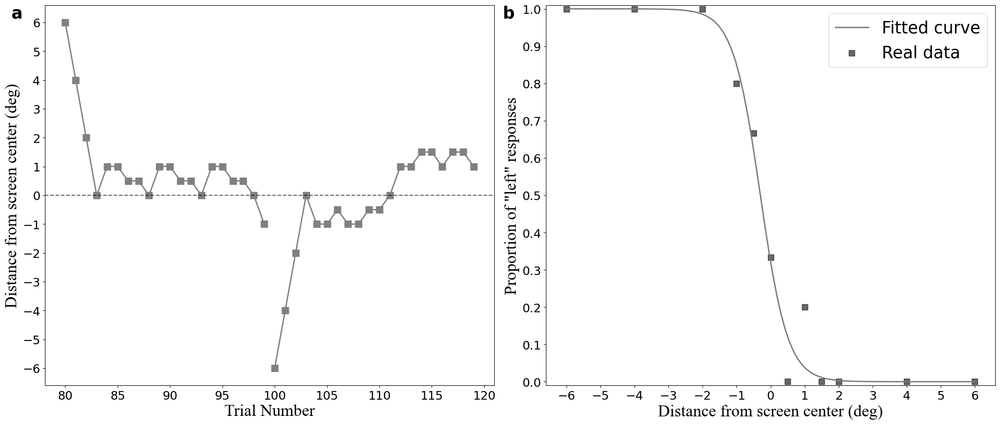

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


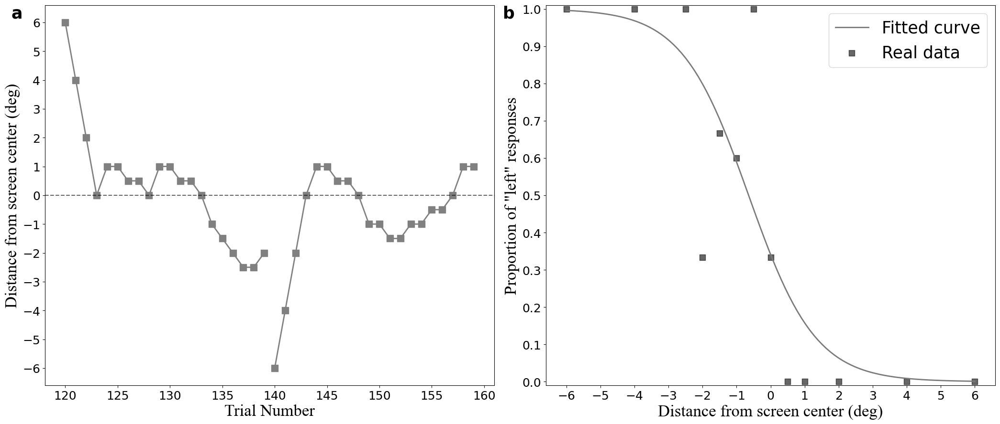

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


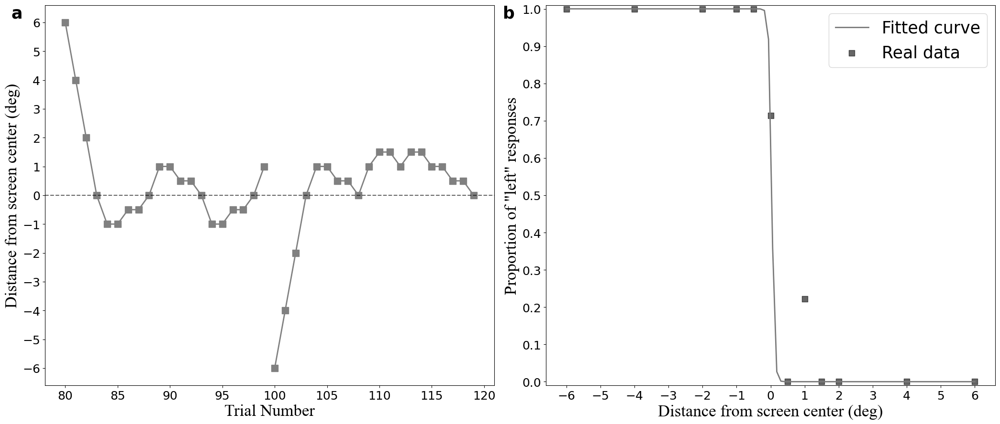

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


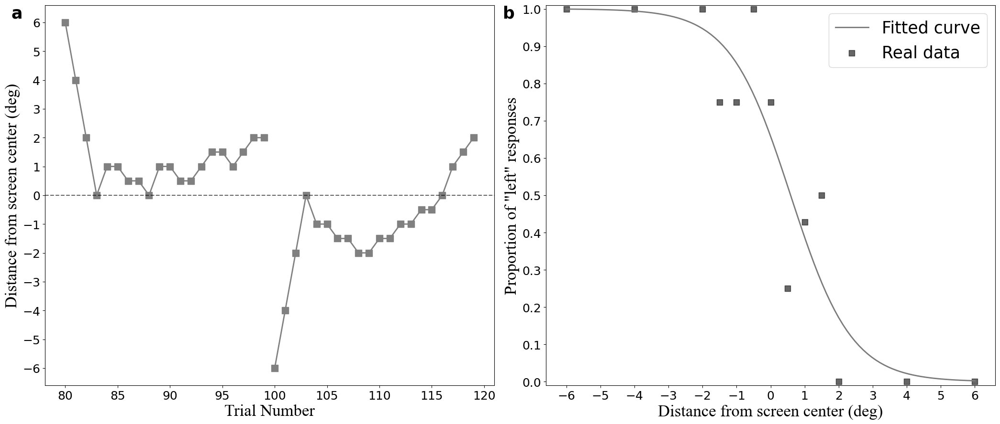

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


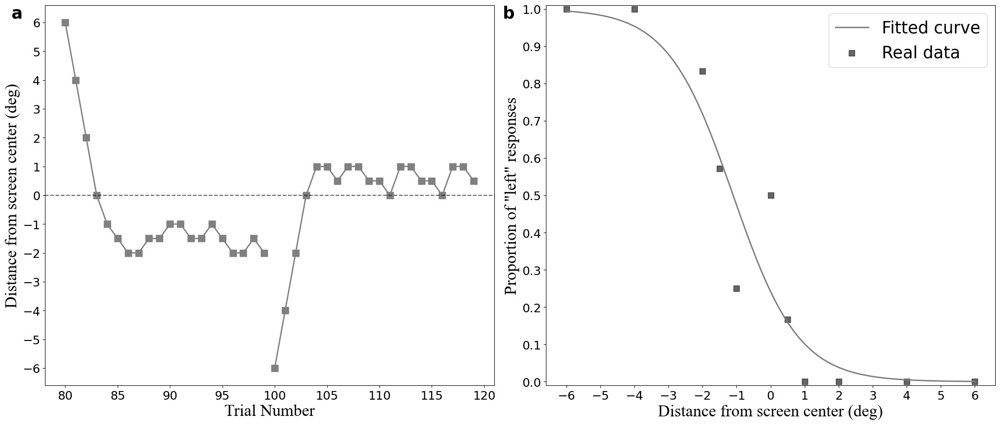

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


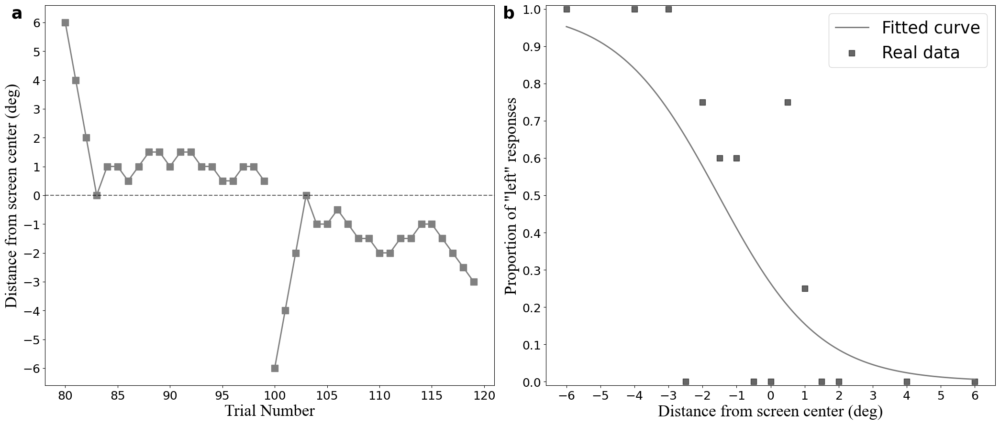

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


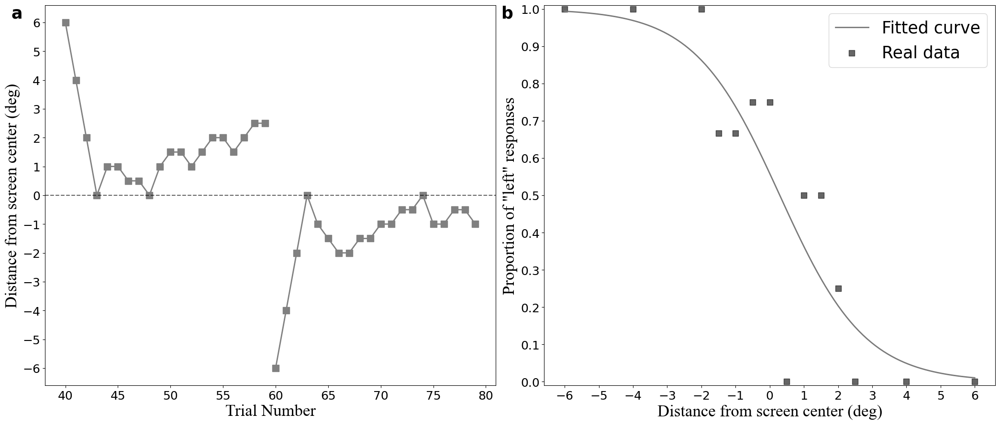

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


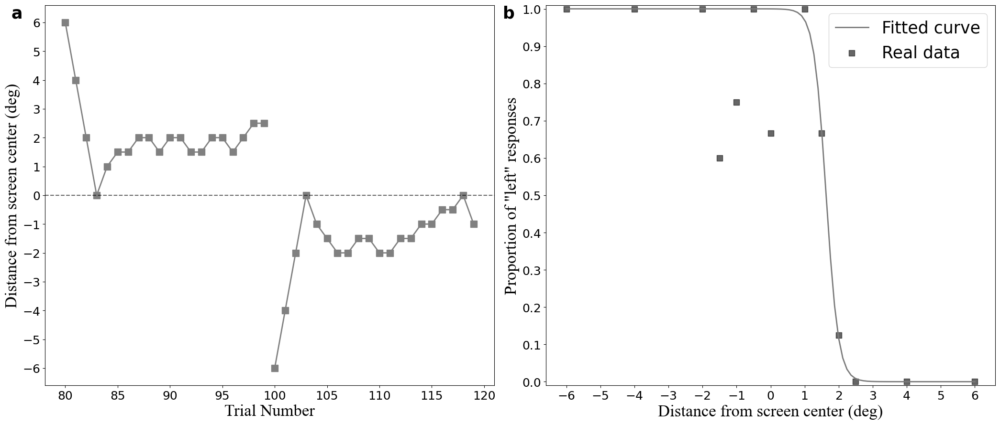

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


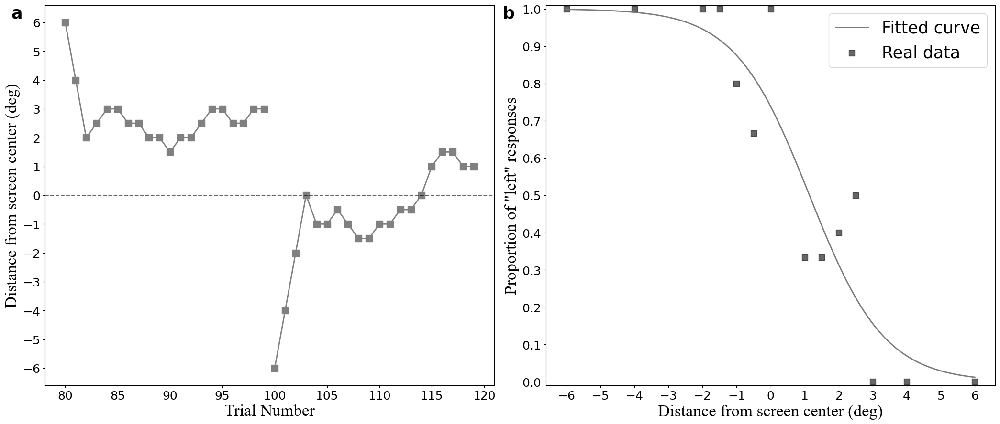

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


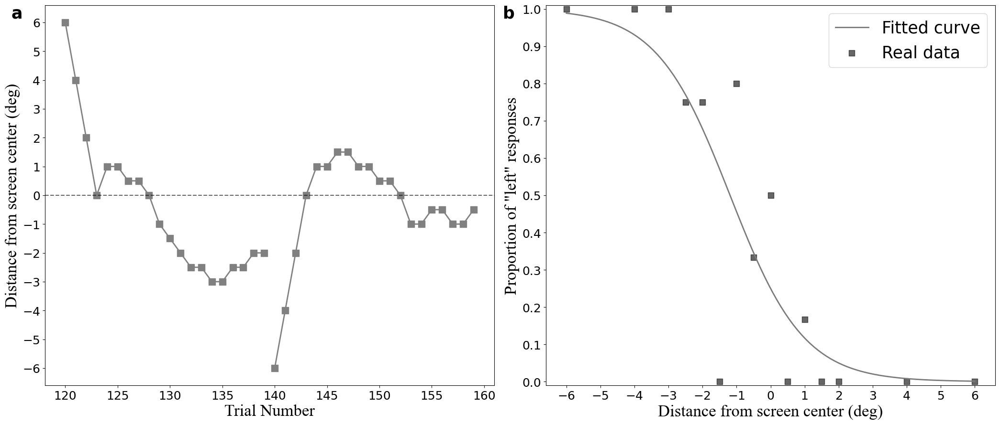

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


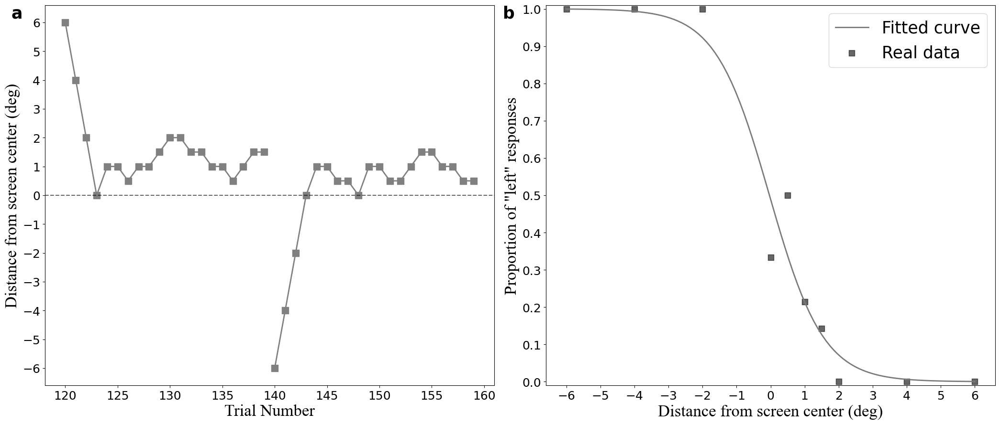

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


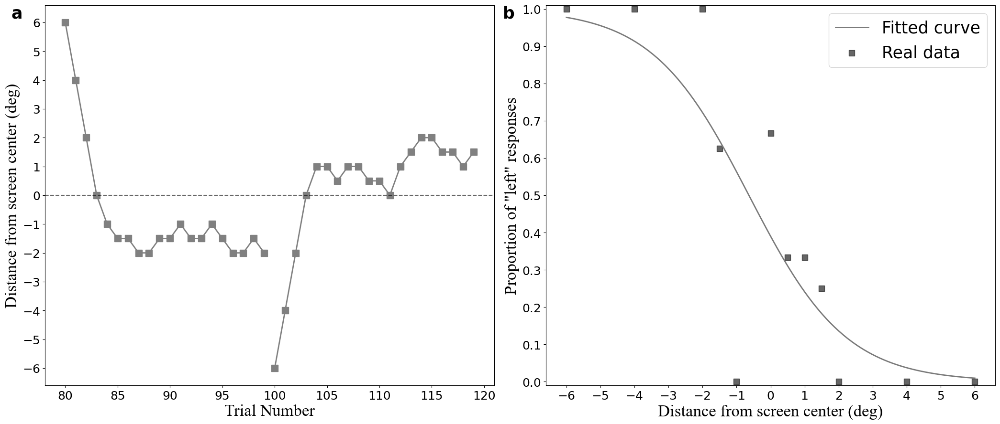

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


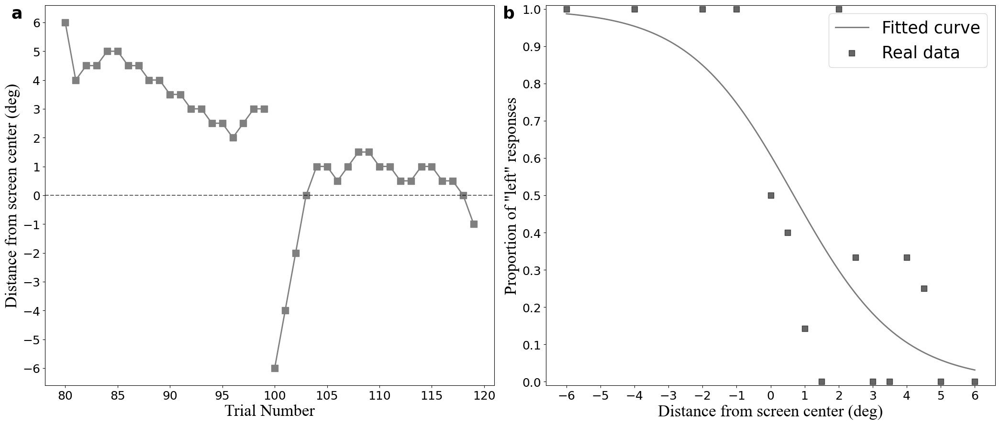

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


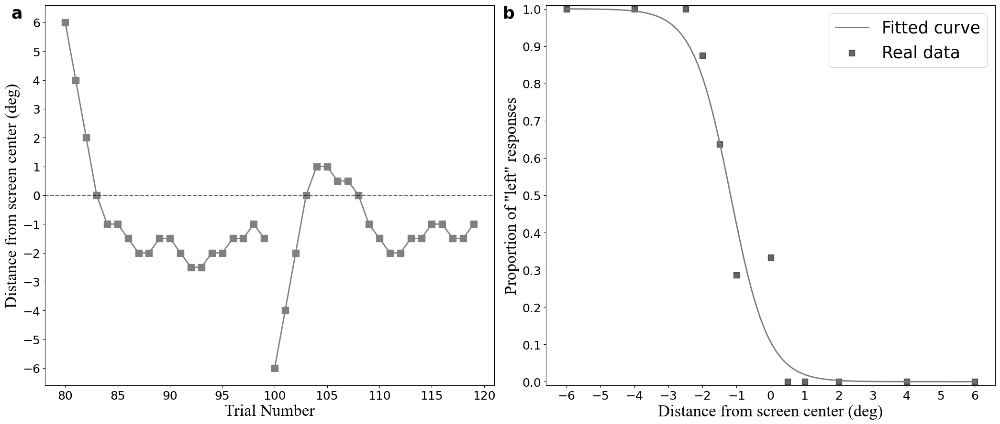

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


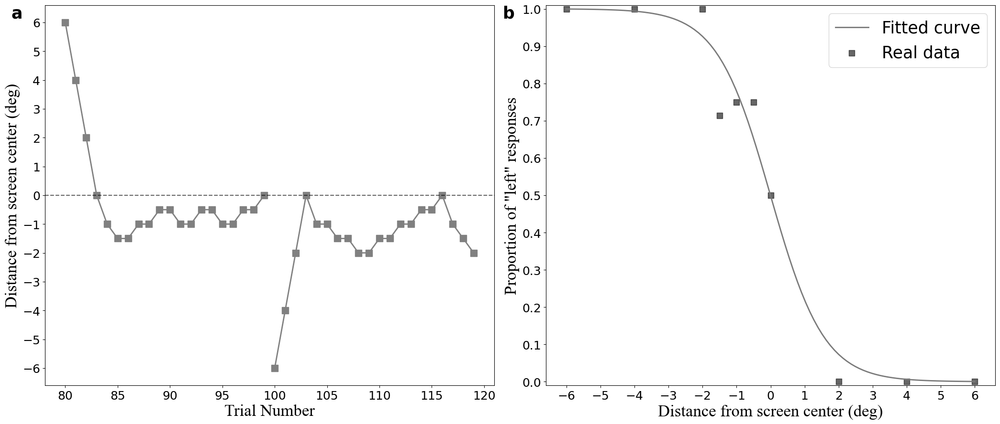

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


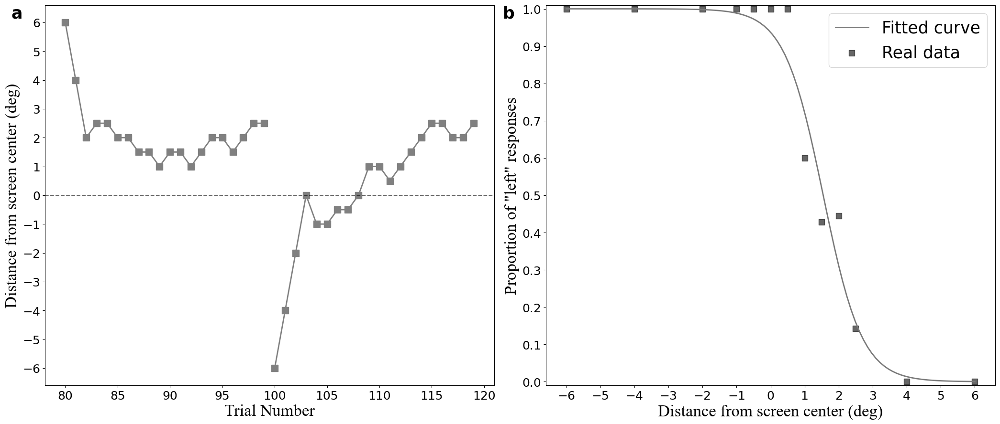

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


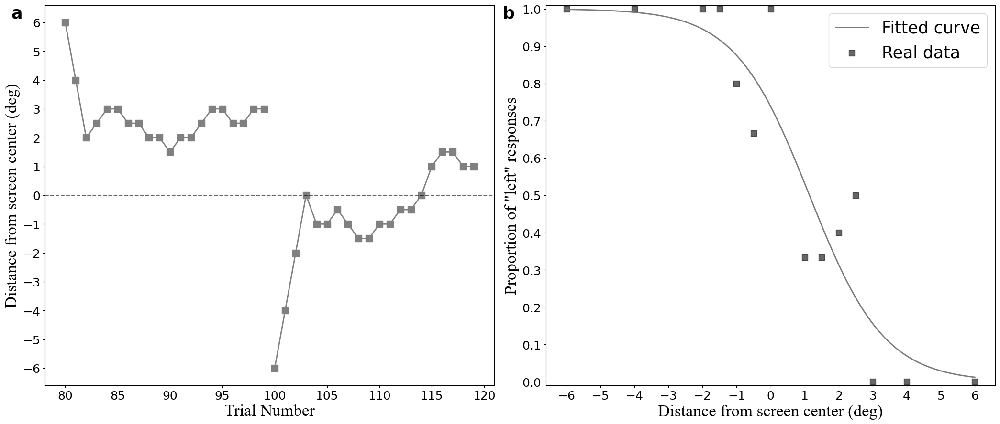

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def psychometric_function(stimulus, PSE, JND):
    return 1 / (1 + np.exp((stimulus - PSE) / JND))

def plot_filtered_graphs(data_list_clean, data_list, target_noise_level=4.5):
    markers = ['o', 's', 'D', '^', 'v']
    
    for elem, (data_clean, data) in enumerate(zip(data_list_clean, data_list)):
        # Filter data for the specific noise level
        data_clean_filtered = data_clean[data_clean['noise_lvl'] == target_noise_level]
        data_filtered = data[data['noise_lvl'] == target_noise_level]

        if data_clean_filtered.empty or data_filtered.empty:
            continue  # Skip this loop iteration if there is no data for the target noise level
        
        fig, axes = plt.subplots(1, 2, figsize=(21,9))  # 1 row, 2 columns for both types of plots

        # Staircase plot
        ax = axes[0]
        slope_values = data_clean_filtered['slope']
        threshold = 20
        slope_values_start = slope_values.iloc[:threshold]
        slope_values_other = slope_values.iloc[threshold:]

        ax.plot(slope_values_start, 's-', color='gray', linewidth=2, markersize=10)
        ax.plot(slope_values_other, 's-', color='gray', linewidth=2, markersize=10)
        ax.axhline(y=0, color='k', linestyle='--', alpha=0.6)
        ax.set_xlabel('Trial Number', fontsize=25, fontname="Times New Roman")
        ax.set_ylabel('Distance from screen center (deg)', fontsize=25, fontname="Times New Roman")
#         ax.set_xticks(np.arange(0, 41, 2))
        ax.set_yticks(np.arange(np.floor(slope_values.min()), np.ceil(slope_values.max()) + 1, 1))
        ax.legend(fontsize=25, frameon=False, loc='best')
        ax.text(-0.05, 1., 'a', transform=ax.transAxes, fontsize=25, fontweight='bold', va='top', ha='right')
        ax.tick_params(axis='both', which='major', labelsize=18)
        # Psychometric curve plot
        ax = axes[1]
        x_data = data_filtered['slope']
        y_data = data_filtered['prop_left']
        popt, _ = curve_fit(psychometric_function, x_data, y_data, p0=(0, 0.5), method='trf', bounds=([-np.inf, 0], [np.inf, np.inf]))
        PSE, JND = popt
        x_values = np.linspace(min(x_data), max(x_data), 100)
        y_values = psychometric_function(x_values, PSE, JND)
        color = plt.cm.Greys(0.6)
        ax.plot(x_values, y_values, label='Fitted curve', color=color, markersize=10,linewidth=2)
        ax.scatter(x_data, y_data, color='k', label='Real data', marker='s', alpha=0.6,s=85)

        ax.set_ylim(-0.01, 1.01)
        ax.set_xticks(np.arange(-6, 7, 1))
        ax.set_yticks(np.arange(0, 1.1, 0.1))
        ax.set_xlabel('Distance from screen center (deg)', fontsize=25, fontname="Times New Roman")
        ax.set_ylabel('Proportion of "left" responses', fontsize=25, fontname="Times New Roman")
        ax.legend(loc='best', fontsize=25)
        ax.text(-0.07, 1., 'b', transform=ax.transAxes, fontsize=25, fontweight='bold', va='top', ha='right')
        ax.tick_params(axis='both', which='major', labelsize=18)
        plt.tight_layout()
        plt.show()

plot_filtered_graphs(data_l_clean, data_l)

In [68]:
for elem, data in enumerate(data_l):
#         grouped_data= data
    grouped_data = data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()
    unique_noise_levels = grouped_data['noise_lvl'].unique()
    print(grouped_data)
    for i, noise in enumerate(unique_noise_levels):
        subset = grouped_data[grouped_data['noise_lvl'] == noise]
        slope_values = subset['slope']
        prop_left_values = subset['prop_left']
#         print(subset)

    noise_lvl  slope  prop_left
0         1.5   -6.0   1.000000
1         1.5   -4.0   1.000000
2         1.5   -2.0   1.000000
3         1.5   -1.0   1.000000
4         1.5   -0.5   1.000000
5         1.5    0.0   0.571429
6         1.5    0.5   0.166667
7         1.5    1.0   0.000000
8         1.5    2.0   0.000000
9         1.5    4.0   0.000000
10        1.5    6.0   0.000000
11        3.0   -6.0   1.000000
12        3.0   -4.0   1.000000
13        3.0   -2.5   1.000000
14        3.0   -2.0   0.666667
15        3.0   -1.5   1.000000
16        3.0   -1.0   1.000000
17        3.0   -0.5   0.714286
18        3.0    0.0   0.500000
19        3.0    0.5   0.000000
20        3.0    1.0   0.000000
21        3.0    2.0   0.000000
22        3.0    4.0   0.000000
23        3.0    6.0   0.000000
24        4.5   -6.0   1.000000
25        4.5   -4.0   1.000000
26        4.5   -2.0   1.000000
27        4.5   -1.0   0.800000
28        4.5   -0.5   0.666667
29        4.5    0.0   0.333333
30      

In [69]:
# Function to calculate performance metrics (mean reaction time and accuracy)
def calculate_performance_metrics(data, noise, slope_values):
    reaction_times = data[(data['noise_lvl'] == noise) & (data['slope'].isin(slope_values))]['RT']
    accuracy = data[(data['noise_lvl'] == noise) & (data['slope'].isin(slope_values))]['acc']
    prop_left = data[(data['noise_lvl'] == noise) & (data['slope'].isin(slope_values))]['prop_left']
    mean_reaction_time = np.mean(reaction_times)
    mean_accuracy = np.mean(accuracy)
    mean_prop_left = np.mean(prop_left)
    return mean_reaction_time, mean_accuracy, mean_prop_left

In [88]:
# Generate results table
def generate_results_table(data_list):
    results = []
    for elem, data in enumerate(data_list):
#         grouped_data=  data
        grouped_data = data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()
        unique_noise_levels = grouped_data['noise_lvl'].unique()

        for i, noise in enumerate(unique_noise_levels):
            subset = grouped_data[grouped_data['noise_lvl'] == noise]
            slope_values = subset['slope']
            prop_left_values = subset['prop_left']

            threshold, slope, lapse = fit_sigmoid_function(slope_values, prop_left_values)
            mean_reaction_time, mean_accuracy, mean_prop_left = calculate_performance_metrics(data, noise, slope_values)
                        # Calculate R-squared value
            residuals = prop_left_values - sigmoid(slope_values, threshold, slope, lapse)
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((prop_left_values - np.mean(prop_left_values))**2)
            r_squared = 1 - (ss_res / ss_tot)
            slope_at_threshold = (sigmoid(threshold, threshold, slope, lapse) - sigmoid(threshold - 0.01, threshold, slope, lapse)) / 0.01
            result = {
                'Subject': elem,
                'Noise_Level': noise,
                'Threshold': threshold,
                'Slope': slope,
                'Lapse_Rate': lapse,
                'slope_at_threshold' : slope_at_threshold,
                'r_squared' :r_squared,
                'Mean_Reaction_Time': mean_reaction_time,
                'Mean_Accuracy': mean_accuracy,
            }
            results.append(result)
    
    summary_df = pd.DataFrame(results)
    return summary_df

# Plot psychometric curves
def plot_psychometric_curves(data_list, summary_df):
    markers = ['o', 's', 'D', '^', 'v']   
    for elem, data in enumerate(data_list):
        grouped_data= data
#         grouped_data = data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()
        unique_noise_levels = grouped_data['noise_lvl'].unique()

        fig, ax = plt.subplots(figsize=(5, 4))
        plt.title(f'Psychometric Curves for Subject {elem + 1}')

        for i, noise in enumerate(unique_noise_levels):
            subset = grouped_data[grouped_data['noise_lvl'] == noise]
            slope_values = subset['slope']
            prop_left_values = subset['prop_left']

            threshold, slope, lapse = fit_sigmoid_function(slope_values, prop_left_values)

            x_values = np.linspace(min(slope_values), max(slope_values), 100)
            y_values = sigmoid(x_values, threshold, slope, lapse)

            color = plt.cm.viridis(i / len(unique_noise_levels))
            marker = markers[i % len(markers)]
            label = f'Noise {noise}'
            ax.plot(x_values, y_values, label=label, color=color, marker=marker, markersize=6)

        plt.ylim(-0.01, 1.01)
        plt.xlabel('Distance from center')
        plt.ylabel('Proportion of "left" responses')
        plt.axvline(x=0, color='gray', linestyle='-.', alpha=0.1)
        plt.axhline(y=0.5, color='gray', linestyle='-.', alpha=0.5)
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)

        plt.show()


In [116]:
# Plot psychometric curves
def plot_psychometric_curves_2(data_list, summary_df):
    markers = ['o', 's', 'D', '^', 'v']   
    for elem, data in enumerate(data_list):
        grouped_data = data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()
        unique_noise_levels = grouped_data['noise_lvl'].unique()

        fig, axes = plt.subplots(1, 4, figsize=(20, 5))

        plt.suptitle(f"Psychometric Curves for Subject {elem+1}",fontsize=15)
        for i, noise in enumerate(unique_noise_levels):
            ax = axes[i]
            subset = grouped_data[grouped_data['noise_lvl'] == noise]
            slope_values = subset['slope']
            prop_left_values = subset['prop_left']

            threshold, slope, lapse = fit_sigmoid_function(slope_values, prop_left_values)

            x_values = np.linspace(min(slope_values), max(slope_values), 100)
            y_values = sigmoid(x_values, threshold, slope, lapse)
            
            slope_at_threshold = (sigmoid(threshold, threshold, slope, lapse) - sigmoid(threshold - 0.01, threshold, slope, lapse)) / 0.01
            x_slope_line = np.linspace(min(slope_values), max(slope_values), 100)
            y_slope_line = [sigmoid(x, threshold, slope, lapse) + slope_at_threshold * (x - threshold) for x in x_slope_line]
            ax.plot(x_slope_line, y_slope_line, color='k', linestyle='-', label='Slope Line')
            
#             ax.set_xlim(0, 1)
            ax.set_ylim(-0.01, 1.01)
            ax.set_xticks(np.arange(- 10, 10, 2))
            ax.set_yticks(np.arange(0, 1.1, 0.1))
            
#             # Adjust the x-axis and y-axis limits to [0, 1]
#             ax.set_xlim(0, 1)
#             ax.set_ylim(0, 1)
            
            color = plt.cm.viridis(i / len(unique_noise_levels))
            marker = markers[i % len(markers)]
            label = f'Noise {noise}'
            ax.plot(x_values, y_values, label=label, color=color, marker=marker, markersize=6)
            ax.plot(slope_values, prop_left_values, 'o', label='Data', color='k')

            ax.set_xlabel('Distance from center')
            ax.set_ylabel('Proportion of "left" responses')
            ax.legend()
            ax.grid(True, linestyle='--', alpha=0.6)

In [117]:
from lmfit import Model
def sigmoid(x, threshold, slope, lapse):
    return lapse + (1 - 2 * lapse) / (1 + np.exp(-slope * (x - threshold)))
def fit_sigmoid_function(slope_values, prop_left_values):
    model = Model(sigmoid)
    params = model.make_params(threshold=0, slope=1, lapse=0.01)
    
    try:
#         result = model.fit(prop_left_values, x=slope_values, params=params, method='nelder')
#         result = model.fit(prop_left_values, params, x=slope_values, method='powell')
        result = model.fit(prop_left_values, params, x=slope_values, method='bfgs')
    except Exception as e:
        print(f"Optimization failed: {e}")
        return np.nan, np.nan, np.nan
    
    threshold = result.best_values['threshold']
    slope = result.best_values['slope']
    lapse = result.best_values['lapse']
    
    return threshold, slope, lapse


ModuleNotFoundError: No module named 'lmfit'

In [118]:
data_l = data_list(data_csv)
summary_df = generate_results_table(data_l)
summary_df

NameError: name 'fit_sigmoid_function' is not defined

In [119]:
plot_psychometric_curves(data_l, summary_df)

NameError: name 'summary_df' is not defined

In [120]:
plot_psychometric_curves_2(data_l, summary_df)

NameError: name 'summary_df' is not defined

## With P = 1 / (1 + np.exp((-slope * (x - threshold))))

In [121]:

def sigmoid(x, slope, threshold):
    return 1 / (1 + np.exp((slope * (x - threshold))))

# Function to fit the sigmoid function using lmfit
def fit_sigmoid_function(slope_values, prop_left_values):
    model = Model(sigmoid)
    params = model.make_params(slope=1, threshold=0)
    result = model.fit(prop_left_values, params, x=slope_values, method='bfgs')

#     result = model.fit(prop_left_values, params, x=slope_values, method='nelder')
#     result = model.fit(prop_left_values, params, x=slope_values, method='powell')

#     result = model.fit(prop_left_values, params, x=slope_values)
    return result.best_values['slope'], result.best_values['threshold']

# Function to calculate performance metrics (mean reaction time and accuracy)
def calculate_performance_metrics(data, noise, slope_values):
    reaction_times = data[(data['noise_lvl'] == noise) & (data['slope'].isin(slope_values))]['RT']
    accuracy = data[(data['noise_lvl'] == noise) & (data['slope'].isin(slope_values))]['acc']
    prop_left = data[(data['noise_lvl'] == noise) & (data['slope'].isin(slope_values))]['prop_left']
    mean_reaction_time = np.mean(reaction_times)
    mean_accuracy = np.mean(accuracy)
    mean_prop_left = np.mean(prop_left)
    return mean_reaction_time, mean_accuracy, mean_prop_left

# Generate results table
def generate_results_table(data_list):
    results = []
    for elem, data in enumerate(data_list):
        grouped_data = data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()
        unique_noise_levels = grouped_data['noise_lvl'].unique()

        for i, noise in enumerate(unique_noise_levels):
            subset = grouped_data[grouped_data['noise_lvl'] == noise]
            slope_values = subset['slope']
            prop_left_values = subset['prop_left']

            slope, threshold = fit_sigmoid_function(slope_values, prop_left_values)
            mean_reaction_time, mean_accuracy, mean_prop_left = calculate_performance_metrics(data, noise, slope_values)

            # Calculate R-squared value
            residuals = prop_left_values - sigmoid(slope_values, slope, threshold)
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((prop_left_values - np.mean(prop_left_values))**2)
            r_squared = 1 - (ss_res / ss_tot)
            slope_at_threshold = (sigmoid(threshold,  slope, threshold,) - sigmoid(threshold - 0.01, slope, threshold)) / 0.01
            result = {
                'Subject': elem,
                'Noise_Level': noise,
                'Threshold': threshold,
                'Slope': slope,
                'slope_at_threshold': slope_at_threshold,
                'r_squared': r_squared,
                'Mean_Reaction_Time': mean_reaction_time,
                'Mean_Accuracy': mean_accuracy,
            }
            results.append(result)

    summary_df = pd.DataFrame(results)
    return summary_df

# Plot psychometric curves
def plot_psychometric_curves(data_list, summary_df):
    markers = ['o', 's', 'D', '^', 'v']
    for elem, data in enumerate(data_list):
        grouped_data = data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()
        unique_noise_levels = grouped_data['noise_lvl'].unique()

        fig, ax = plt.subplots(figsize=(5, 4))
        plt.title(f'Psychometric Curves for Subject {elem + 1}')

        for i, noise in enumerate(unique_noise_levels):
            subset = grouped_data[grouped_data['noise_lvl'] == noise]
            slope_values = subset['slope']
            prop_left_values = subset['prop_left']

            slope, threshold = fit_sigmoid_function(slope_values, prop_left_values)
            x_values = np.linspace(min(slope_values), max(slope_values), 100)
            y_values = sigmoid(x_values, slope, threshold)

            color = plt.cm.viridis(i / len(unique_noise_levels))
            marker = markers[i % len(markers)]
            label = f'Noise {noise}'
            ax.plot(x_values, y_values, label=label, color=color, marker=marker, markersize=6)

        plt.ylim(-0.01, 1.01)
        plt.xlabel('Distance from center')
        plt.ylabel('Proportion of "left" responses')
        plt.axvline(x=0, color='gray', linestyle='-.', alpha=0.1)
        plt.axhline(y=0.5, color='gray', linestyle='-.', alpha=0.5)
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)

        plt.show()


In [122]:
data_l = data_list(data_csv)
summary_df = generate_results_table(data_l)
summary_df

NameError: name 'Model' is not defined

In [ ]:

plot_psychometric_curves(data_l, summary_df)

### Without data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()

In [ ]:
def sigmoid(x, threshold, slope, lapse):
    return lapse + (1 - 2 * lapse) / (1 + np.exp(-slope * (x - threshold)))
def fit_psychometric_function(data):
    model = Model(sigmoid)
    x_data = data['slope']
    y_data = data['prop_left']
    params = model.make_params(threshold=0, slope=1, lapse=0)
    try:
#         result = model.fit(prop_left_values, x=slope_values, params=params, method='nelder')
#         result = model.fit(prop_left_values, params, x=slope_values, method='powell')
        result = model.fit(y_data, params, x=x_data, method='bfgs')
    except Exception as e:
        print(f"Optimization failed: {e}")
        return np.nan, np.nan, np.nan
    
    threshold = result.best_values['threshold']
    slope = result.best_values['slope']
    lapse = result.best_values['lapse']
    
    return threshold, slope, lapse
def generate_results_table(data_list):
    results = []
    for elem, data in enumerate(data_list):
#         grouped_data=  data
        grouped_data = data.groupby('noise_lvl')
#         grouped_data = data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()
        unique_noise_levels = grouped_data['noise_lvl'].unique()
#         for i, noise in enumerate(unique_noise_levels):
        for noise_lvl, data_group in grouped_data:
            threshold, slope,lapse = fit_psychometric_function(data_group)    

            mean_reaction_time, mean_accuracy, mean_prop_left = calculate_performance_metrics(data, noise, slope_values)
                        # Calculate R-squared value
            residuals = prop_left_values - sigmoid(slope_values, threshold, slope, lapse)
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((prop_left_values - np.mean(prop_left_values))**2)
            r_squared = 1 - (ss_res / ss_tot)
            slope_at_threshold = (sigmoid(threshold, threshold, slope, lapse) - sigmoid(threshold - 0.01, threshold, slope, lapse)) / 0.01
            result = {
                'Subject': elem,
                'Noise_Level': noise,
                'Threshold': threshold,
                'Slope': slope,
                'Lapse_Rate': lapse,
                'slope_at_threshold' : slope_at_threshold,
                'r_squared' :r_squared,
                'Mean_Reaction_Time': mean_reaction_time,
                'Mean_Accuracy': mean_accuracy,
            }
            results.append(result)
    
    summary_df = pd.DataFrame(results)
    return summary_df
# Plot psychometric curves
def plot_psychometric_curves(data_list, summary_df):
    markers = ['o', 's', 'D', '^', 'v']   
    for elem, data in enumerate(data_list):
        grouped_data = data.groupby('noise_lvl')
#         grouped_data = data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()
        unique_noise_levels = grouped_data['noise_lvl'].unique()

        fig, ax = plt.subplots(figsize=(5, 4))
        plt.title(f'Psychometric Curves for Subject {elem + 1}')
#         for i, noise in enumerate(unique_noise_levels):
#             subset = grouped_data[grouped_data['noise_lvl'] == noise]
#             slope_values = subset['slope']
#             prop_left_values = subset['prop_left']
        for noise_lvl, data_group in grouped_data :
            threshold, slope,lapse = fit_psychometric_function(data_group)    

            x_values = np.linspace(min(slope_values), max(slope_values), 100)
            y_values = sigmoid(x_values, threshold, slope, lapse)

            color = plt.cm.viridis(i / len(unique_noise_levels))
            marker = markers[i % len(markers)]
            label = f'Noise {noise_lvl}'
            ax.plot(x_values, y_values, label=label, marker = 'o',markersize=3)

        plt.ylim(-0.01, 1.01)
        plt.xticks(range(-10, 11, 1))
        plt.yticks(np.arange(0, 1, 0.1))
        plt.xlabel('Distance from center')
        plt.ylabel('Proportion of "left" responses')
        plt.axvline(x=0, color='gray', linestyle='-.', alpha=0.1)
        plt.axhline(y=0.5, color='gray', linestyle='-.', alpha=0.5)
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)

        plt.show()

In [ ]:
summary_df = generate_results_table(data_l)
summary_df

In [ ]:
plot_psychometric_curves(data_l, summary_df)

In [ ]:
def sigmoid(x,  threshold,slope,):
    return 1 / (1 + np.exp((slope * (x - threshold))))

def fit_psychometric_function(data):
    model = Model(sigmoid)
    x_data = data['slope']
    y_data = data['prop_left']
    params = model.make_params(threshold=0, slope=1, )
    try:
#         result = model.fit(prop_left_values, x=slope_values, params=params, method='nelder')
#         result = model.fit(prop_left_values, params, x=slope_values, method='powell')
        result = model.fit(y_data, params, x=x_data, method='bfgs')
    except Exception as e:
        print(f"Optimization failed: {e}")
        return np.nan, np.nan, np.nan
    
    threshold = result.best_values['threshold']
    slope = result.best_values['slope']

    return threshold, slope, 

In [ ]:
def generate_results_table(data_list):
    results = []
    for elem, data in enumerate(data_list):
#         grouped_data=  data
        grouped_data = data.groupby('noise_lvl')
#         grouped_data = data.groupby(['noise_lvl', 'slope'])['prop_left'].mean().reset_index()
        unique_noise_levels = grouped_data['noise_lvl'].unique()
#         for i, noise in enumerate(unique_noise_levels):
        for noise_lvl, data_group in grouped_data:
            threshold,slope = fit_psychometric_function(data_group)    

            mean_reaction_time, mean_accuracy, mean_prop_left = calculate_performance_metrics(data, noise, slope_values)
                        # Calculate R-squared value
            residuals = prop_left_values - sigmoid(slope_values, threshold, slope, )
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((prop_left_values - np.mean(prop_left_values))**2)
            r_squared = 1 - (ss_res / ss_tot)
            slope_at_threshold = (sigmoid(threshold, threshold, slope, ) - sigmoid(threshold - 0.01, threshold, slope,)) / 0.01
            result = {
                'Subject': elem,
                'Noise_Level': noise,
                'Threshold': threshold,
                'Slope': slope,
                
                'slope_at_threshold' : slope_at_threshold,
                'r_squared' :r_squared,
                'Mean_Reaction_Time': mean_reaction_time,
                'Mean_Accuracy': mean_accuracy,
            }
            results.append(result)
    
    summary_df = pd.DataFrame(results)
    return summary_df

In [ ]:
summary_df = generate_results_table(data_l)
summary_df